<a href="https://colab.research.google.com/github/Untick/IrisID_gr2/blob/Prokhorenko-Evgeniy-folder/%D0%9F%D0%BE%D0%B4%D0%B3%D0%BE%D1%82%D0%BE%D0%B2%D0%BA%D0%B0_%D0%B4%D0%B0%D1%82%D0%B0_%D1%81%D0%B5%D1%82%D0%B0_%D0%B4%D0%BB%D1%8F_%D1%81%D1%82%D0%B0%D0%B6%D0%B8%D1%80%D0%BE%D0%B2%D0%BA%D0%B8_%D1%84%D0%B8%D0%BD%D0%B0%D0%BB%D1%8C%D0%BD%D0%B0%D1%8F_%D0%B2%D0%B5%D1%80%D1%81%D0%B8%D1%8F.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://docs.google.com/spreadsheets/d/1p5XxlS3kKzjlq5MI2lxOW2UuE0hN7KbtuPd8d-GN2Ag/edit#gid=2096248759

# Загрузка необходимых слоев для работы


In [1]:
from google.colab import drive
drive.mount('/content/drive')
! pip install Augmentor
import Augmentor
import zipfile
import os
import cv2
import shutil
import numpy as np
from PIL import Image
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

import seaborn as sns
# Строим график точности на проверочной выборке
import matplotlib.pyplot as plt

# Утилиты предобработки данных
from keras import  utils

# устанавливаем Autokeras
!pip install autokeras
!pip install --upgrade autokeras
import autokeras as ak

from PIL import Image                     # Отрисовка изображений
import random                             # Генерация случайных чисел
import tensorflow as tf
'''
это одна из наиболее популярных библиотек машинного обучения и искусственного
интеллекта. Она используется для создания и обучения различных моделей машинного
обучения, в том числе нейронных сетей.
'''
from sklearn.metrics import confusion_matrix #
!pip install keras-tuner --upgrade
from keras_tuner.applications import HyperResNet
import keras_tuner
import keras_tuner as kt
import math
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
import gdown

%matplotlib inline




Mounted at /content/drive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.6/148.6 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.7/527.7 kB 47.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 108.6 MB/s eta 0:00:00


# Раздел предобработки данных для подачи в нейро сеть


## Выделяем тестовую выборку из общих данных, а так же провеодим пред подготовку данных:
1.  Распаковка архива Iris.zip в папку  Dekart64
2.  Выделяем тестовую выборку из общего объема
3.  Преобразования изображения в декартову систему координат
4.  Обрезает изображении
5.  Развертки круга в плоскость

В результате этих действий на диске создается папки:
1.  Dekart64 - первичные данные (по 5 изображений каждого класса)
2.  test -  тестовая выборка (по 1 изображению каждого класса)
3.  Dekart64_1 - данные после обработки круг развернутый в плоскость



In [2]:
def ring_to_rect(image):
  """
  Данная функция для развертки круга в плоскость
  :param image: входное изображение типа numpy.ndarray
  :return: развернутое изображение типа numpy.ndarray
  """
  size = image.shape[0]  # размер изображения

  outer_radius = size // 2.1  # внешний радиус
  inner_radius_factor = 0.65  # коэффициент внутреннего радиуса относительно внешнего

  # Разворачиваем кольцо
  warped = cv2.warpPolar(image, (size, int(size * math.pi)), (size // 2, size // 2), outer_radius, 10)
  # Поворачиваем на 90 градусов
  straightened = cv2.rotate(warped, cv2.ROTATE_90_COUNTERCLOCKWISE)
  # Обрезаем
  cropped = straightened[: int(straightened.shape[0] * (1 - inner_radius_factor)), :]

  return cropped

def crop_white_corners(img):
    '''
    Обрезает верхнюю и нижнюю части изображения относительно центра.

    Args:
        img: входное изображение

    Returns:
        измененное изображение
    '''
    # получаем высоту изображения
    height = img.shape[0]

    # определяем высоту области для обрезки
    crop_height = int(height * 0.02)

    # вычисляем координаты области для обрезки
    y_top = crop_height
    y_bottom = height - crop_height

    # обрезаем верхнюю и нижнюю части изображения
    cropped_img = img[y_top:y_bottom, :]

    return cropped_img

# Функция для преобразования изображения в декартову систему координат
def cartesian_warp(img):
    height, width = img.shape[:-1]
    cartImg = np.zeros((height, width, 3), dtype=np.uint8)

    for y in range(height):
        for x in range(width):
            # Преобразуем координаты (x,y) в полярные координаты (r,theta)
            r = np.sqrt((x - width / 2)**2 + (y - height / 2)**2)
            theta = np.arctan2(y - height / 2, x - width / 2)

            # Вычисляем соответствующие координаты в декартовой системе координат
            xcart = int(r * np.cos(theta) + width / 2)
            ycart = int(r * np.sin(theta) + height / 2)

            # Копируем значения пикселей из исходного изображения в новое изображение
            if xcart >= 0 and xcart < width and ycart >= 0 and ycart < height:
                cartImg[y, x] = img[ycart, xcart]

    return cartImg


def unwrap_circular_image(image):
    # Берем центр изображения
    height, width = image.shape[:2]
    center_x, center_y = width // 2, height // 2

    # Вычисляем максимальный радиус окружности
    max_radius = min(center_x, center_y)

    # Вычисляем минимальный радиус, чтобы обрезать изображение по краям
    min_radius = int(max_radius * 0.6)

    # Создаем новое изображение с теми же размерами, что и исходное изображение.
    unwrapped_image = np.zeros((2 * min_radius, 2 * min_radius, 3), dtype=np.uint8)

    # Итерируемся по каждому пикселю в новом изображении
    for y in range(unwrapped_image.shape[0]):
        for x in range(unwrapped_image.shape[1]):
            # Преобразуем координаты (x, y) в полярные
            r = np.sqrt((x - min_radius) ** 2 + (y - min_radius) ** 2)
            theta = np.arctan2(y - min_radius, x - min_radius)

            # Вычисляем соответствующие (x, y) координаты в исходном изображении
            orig_x = int(center_x + r * np.cos(theta))
            orig_y = int(center_y + r * np.sin(theta))

            # Копируем значение пикселя из исходного изображения в новое изображение.
            if orig_x >= 0 and orig_x < width and orig_y >= 0 and orig_y < height:
                unwrapped_image[y, x] = image[orig_y, orig_x]

    return unwrapped_image


In [3]:
# Разархивация датасета в директорию '/content/drive/MyDrive/Dekart'
#!unzip -qo "/content/drive/MyDrive/Dekart/Iris.zip" -d /content/drive/MyDrive/Dekart/Dekart64
# Указываем путь к архиву и название папки, в которую нужно распаковать
#zip_path = "/content/drive/MyDrive/Dekart/Iris.zip"
# Папка с папками картинок, рассортированных по категориям
dir_path = '/content/drive/MyDrive/Dekart/Dekart64/'
# задаем путь до папки с результатами
folder_path = '/content/drive/MyDrive/Dekart/Dekart64/'
# создаем новую папку для тестирования
#test_folder_path = '/content/drive/MyDrive/Dekart/test'
# Производим отделение тестовой выборки и ее перенос в заданную папку
#if not os.path.exists(test_folder_path):
#    os.makedirs(test_folder_path)
# проходим по всем папкам в исходной директории
#for dirpath, dirnames, filenames in os.walk(folder_path):
    # если в папке есть файлы, выбираем случайный и перемещаем его в новую папку
#    if len(filenames) > 0:
#        selected_file = random.choice(filenames)
        # создаем новую папку с таким же названием, как исходная
#        new_dir_path = os.path.join(test_folder_path, os.path.basename(dirpath))
#        if not os.path.exists(new_dir_path):
#            os.makedirs(new_dir_path)
        # перемещаем выбранный файл в новую папку
#        src_file_path = os.path.join(dirpath, selected_file)
#        dst_file_path = os.path.join(new_dir_path, selected_file)
#        shutil.move(src_file_path, dst_file_path)


# новая папка для сохранения результатов
new_dir_path = '/content/drive/MyDrive/Dekart/Dekart64_1'

# проходим по каждому файлу в папке с изображениями
for foldername in os.listdir(dir_path):
    folder_path = os.path.join(dir_path, foldername)

    # если текущий элемент - папка, проходим по файлам внутри
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)

            # проверяем, что файл является изображением
            if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
                # загружаем изображение
                img = cv2.imread(file_path)

                # производим развертку в декартову систему координат
                img_resized = cartesian_warp(img)

                # обрезаем изображении
                img_cropped = crop_white_corners(img_resized)

                # выделяем круглую часть изображения
                img_unwrapped = unwrap_circular_image(img_cropped)

                # Производим развертку изображения в плоскость
                #img_rect = ring_to_rect(img_unwrapped)

                # сохраняем изображение в новую папку
                new_folder_path = os.path.join(new_dir_path, foldername)
                if not os.path.exists(new_folder_path):
                    os.makedirs(new_folder_path)
                cv2.imwrite(os.path.join(new_folder_path, filename), img_unwrapped)



### Аугментация изображений для получения больше картинок для обучения нейронной сети
В результате выполнения кода получаем:
1.  Созданную новую папку Dekart64_2. Созданная папка дублирует предыдущую папку Dekart64_1, но имеет ряд изменений:
1.  Для каждой папки проводится Аугментация по заданным параметрам
2.  увеличение числа изобразений до 65 для каждого класса
3.  выводим информацию по каждому классу об завершении аугментации
4.  обрезаем каждое изображение по размеру 150 х 150

In [4]:
# Указываем название папки, в которой хранятся данные
dir_path = "/content/drive/MyDrive/Dekart/Dekart64_1"

'''
    берем данные из папки "/content/drive/MyDrive/Dekart/Dekart64_1",
    затем для каждой подпапки в этой папке создаст генератор аугментации и применит
    к нему набор аугментационных операций, сохраняя измененные изображения в
    подпапку с суффиксом "_augmented". В каждой папке содержится по 6 изображений
'''
from PIL import Image                     # Отрисовка изображений
# Применяем аугментацию к каждой папке с изображениями
for folder in os.listdir(dir_path):
    if os.path.isdir(os.path.join(dir_path, folder)):
        # Создаем генератор аугментации для каждой папки
        p = Augmentor.Pipeline(os.path.join(dir_path, folder), output_directory=os.path.join('/content/drive/MyDrive/Dekart/Dekart64_2', folder))
        # Добавляем операции аугментации
        # Вращение изображения
        p.rotate(probability=0.2, max_left_rotation=5, max_right_rotation=5)
        # Изменение яркости
        p.random_brightness(probability=0.5, min_factor=1.1, max_factor=1.2)
        # Изменение к онтрасности
        p.random_contrast(probability=0.5, min_factor=1.0, max_factor=1.2)
        #Изменение размера
        p.resize(probability=1.0, width=150, height=150)
        try:
            # Применяем аугментацию
            p.sample(65)
        except PIL.UnidentifiedImageError as e:
            print("Encountered an error: ", e.args)
            continue
        print('Аугментация завершена')
        print(folder, '- Аугментация завершена')


Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/001.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7A56F20>: 100%|██████████| 65/65 [00:00<00:00, 96.23 Samples/s]


Аугментация завершена
001 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/002.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6B73155D20>: 100%|██████████| 65/65 [00:00<00:00, 98.91 Samples/s] 


Аугментация завершена
002 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/003.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC700B670>: 100%|██████████| 65/65 [00:00<00:00, 96.89 Samples/s] 


Аугментация завершена
003 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/004.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7C18A30>: 100%|██████████| 65/65 [00:00<00:00, 105.43 Samples/s]


Аугментация завершена
004 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/005.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7A564D0>: 100%|██████████| 65/65 [00:00<00:00, 91.74 Samples/s]


Аугментация завершена
005 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/006.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6B73157190>: 100%|██████████| 65/65 [00:00<00:00, 101.62 Samples/s]


Аугментация завершена
006 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/007.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7009150>: 100%|██████████| 65/65 [00:00<00:00, 99.93 Samples/s] 


Аугментация завершена
007 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/008.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC6FEDBA0>: 100%|██████████| 65/65 [00:00<00:00, 87.41 Samples/s]


Аугментация завершена
008 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/009.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC700B550>: 100%|██████████| 65/65 [00:00<00:00, 89.86 Samples/s]


Аугментация завершена
009 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/010.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC6FECB50>: 100%|██████████| 65/65 [00:00<00:00, 87.12 Samples/s] 


Аугментация завершена
010 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/011.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC6FED7E0>: 100%|██████████| 65/65 [00:00<00:00, 89.71 Samples/s]


Аугментация завершена
011 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/012.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC700B0A0>: 100%|██████████| 65/65 [00:00<00:00, 88.30 Samples/s]


Аугментация завершена
012 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/013.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7037880>: 100%|██████████| 65/65 [00:00<00:00, 94.09 Samples/s] 


Аугментация завершена
013 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/014.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7052950>: 100%|██████████| 65/65 [00:00<00:00, 104.47 Samples/s]


Аугментация завершена
014 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/015.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7068D60>: 100%|██████████| 65/65 [00:00<00:00, 97.64 Samples/s]


Аугментация завершена
015 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/016.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7008DC0>: 100%|██████████| 65/65 [00:00<00:00, 79.18 Samples/s]


Аугментация завершена
016 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/017.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC70094B0>: 100%|██████████| 65/65 [00:00<00:00, 101.46 Samples/s]


Аугментация завершена
017 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/019.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC70522C0>: 100%|██████████| 65/65 [00:00<00:00, 95.81 Samples/s]


Аугментация завершена
019 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/020.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC6FEDD80>: 100%|██████████| 65/65 [00:00<00:00, 99.18 Samples/s] 


Аугментация завершена
020 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/021.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7071A50>: 100%|██████████| 65/65 [00:00<00:00, 93.08 Samples/s]


Аугментация завершена
021 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/022.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6B73156B60>: 100%|██████████| 65/65 [00:00<00:00, 98.93 Samples/s]


Аугментация завершена
022 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/023.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC4695540>: 100%|██████████| 65/65 [00:00<00:00, 96.11 Samples/s]


Аугментация завершена
023 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/024.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7069DB0>: 100%|██████████| 65/65 [00:00<00:00, 98.39 Samples/s]


Аугментация завершена
024 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/025.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7072050>: 100%|██████████| 65/65 [00:00<00:00, 104.07 Samples/s]


Аугментация завершена
025 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/026.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC6FEE560>: 100%|██████████| 65/65 [00:00<00:00, 96.60 Samples/s] 


Аугментация завершена
026 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/027.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7050850>: 100%|██████████| 65/65 [00:00<00:00, 99.04 Samples/s]


Аугментация завершена
027 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/028.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7073730>: 100%|██████████| 65/65 [00:00<00:00, 81.62 Samples/s]


Аугментация завершена
028 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/029.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7050850>: 100%|██████████| 65/65 [00:00<00:00, 89.38 Samples/s]


Аугментация завершена
029 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/030.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7070130>: 100%|██████████| 65/65 [00:00<00:00, 88.50 Samples/s]


Аугментация завершена
030 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/031.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46B4790>: 100%|██████████| 65/65 [00:00<00:00, 86.66 Samples/s]


Аугментация завершена
031 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/032.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7A574F0>: 100%|██████████| 65/65 [00:00<00:00, 90.82 Samples/s]


Аугментация завершена
032 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/033.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46B45E0>: 100%|██████████| 65/65 [00:00<00:00, 92.91 Samples/s] 


Аугментация завершена
033 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/034.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46DBC40>: 100%|██████████| 65/65 [00:00<00:00, 94.30 Samples/s]


Аугментация завершена
034 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/035.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7A564D0>: 100%|██████████| 65/65 [00:00<00:00, 96.36 Samples/s] 


Аугментация завершена
035 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/036.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46DAAA0>: 100%|██████████| 65/65 [00:00<00:00, 104.84 Samples/s]


Аугментация завершена
036 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/037.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46F2830>: 100%|██████████| 65/65 [00:00<00:00, 99.16 Samples/s] 


Аугментация завершена
037 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/038.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46B6710>: 100%|██████████| 65/65 [00:00<00:00, 99.32 Samples/s]


Аугментация завершена
038 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/039.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6B73157190>: 100%|██████████| 65/65 [00:00<00:00, 90.92 Samples/s]


Аугментация завершена
039 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/040.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46D8910>: 100%|██████████| 65/65 [00:00<00:00, 94.70 Samples/s]


Аугментация завершена
040 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/041.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7072FB0>: 100%|██████████| 65/65 [00:00<00:00, 88.79 Samples/s]


Аугментация завершена
041 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/042.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC470A380>: 100%|██████████| 65/65 [00:00<00:00, 92.75 Samples/s]


Аугментация завершена
042 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/043.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC470BC10>: 100%|██████████| 65/65 [00:00<00:00, 97.06 Samples/s] 


Аугментация завершена
043 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/044.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC700ADD0>: 100%|██████████| 65/65 [00:00<00:00, 94.74 Samples/s] 


Аугментация завершена
044 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/045.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC4733370>: 100%|██████████| 65/65 [00:00<00:00, 91.95 Samples/s] 


Аугментация завершена
045 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/046.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46B57B0>: 100%|██████████| 65/65 [00:00<00:00, 98.29 Samples/s] 


Аугментация завершена
046 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/047.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC470AEF0>: 100%|██████████| 65/65 [00:00<00:00, 93.50 Samples/s]


Аугментация завершена
047 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/048.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC47307C0>: 100%|██████████| 65/65 [00:00<00:00, 88.90 Samples/s] 


Аугментация завершена
048 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/049.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC470AEF0>: 100%|██████████| 65/65 [00:00<00:00, 88.66 Samples/s]


Аугментация завершена
049 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/050.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC4708730>: 100%|██████████| 65/65 [00:00<00:00, 91.73 Samples/s]


Аугментация завершена
050 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/051.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46972B0>: 100%|██████████| 65/65 [00:00<00:00, 85.67 Samples/s]


Аугментация завершена
051 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/052.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC700ADD0>: 100%|██████████| 65/65 [00:00<00:00, 95.84 Samples/s] 


Аугментация завершена
052 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/053.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46B57E0>: 100%|██████████| 65/65 [00:00<00:00, 86.45 Samples/s]


Аугментация завершена
053 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/054.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC46B5120>: 100%|██████████| 65/65 [00:00<00:00, 98.89 Samples/s]


Аугментация завершена
054 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/055.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6B73157CD0>: 100%|██████████| 65/65 [00:00<00:00, 72.32 Samples/s]


Аугментация завершена
055 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/056.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC47338E0>: 100%|██████████| 65/65 [00:00<00:00, 96.35 Samples/s] 


Аугментация завершена
056 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/057.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC6FEECB0>: 100%|██████████| 65/65 [00:00<00:00, 94.46 Samples/s] 


Аугментация завершена
057 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/058.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7A9CF40>: 100%|██████████| 65/65 [00:00<00:00, 74.09 Samples/s]


Аугментация завершена
058 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/059.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC4727610>: 100%|██████████| 65/65 [00:00<00:00, 96.49 Samples/s]


Аугментация завершена
059 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/060.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC7008640>: 100%|██████████| 65/65 [00:00<00:00, 92.01 Samples/s]


Аугментация завершена
060 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/061.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC79C5180>: 100%|██████████| 65/65 [00:00<00:00, 68.94 Samples/s]


Аугментация завершена
061 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/062.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC470B070>: 100%|██████████| 65/65 [00:00<00:00, 90.97 Samples/s]


Аугментация завершена
062 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/063.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC4765FF0>: 100%|██████████| 65/65 [00:00<00:00, 102.08 Samples/s]


Аугментация завершена
063 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/064.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC4727610>: 100%|██████████| 65/65 [00:00<00:00, 90.13 Samples/s]


Аугментация завершена
064 - Аугментация завершена
Initialised with 5 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Dekart64_2/018.

Processing <PIL.Image.Image image mode=RGB size=150x150 at 0x7F6AC477A0E0>: 100%|██████████| 65/65 [00:00<00:00, 90.70 Samples/s]

Аугментация завершена
018 - Аугментация завершена


## Проводим подготовку данных для тестовой выборки:

1.  Преобразования изображения в декартову систему координат
2.  Обрезает углы светлого цвета на изображении
3.  Развертки круга в плоскость
4.  обрезание изображения до размеров 150х150

В результате этих действий на диске создается папки:
1.  test -  тестовая выборка (по 1 изображению каждого класса)
2.  test_Izm - данные после обработки круг развернутый в плоскость размером 150 на 150


In [15]:
# Указываем название папки, в которой хранятся данные
dir_path = '/content/drive/MyDrive/Dekart/test/'
# новая папка для сохранения результатов
new_dir_path = '/content/drive/MyDrive/Dekart/test-Izm/'

# проходим по каждому файлу в папке с изображениями
for foldername in os.listdir(dir_path):
    folder_path = os.path.join(dir_path, foldername)

    # если текущий элемент - папка, проходим по файлам внутри
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)

            # проверяем, что файл является изображением
            if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
                # загружаем изображение
                img = cv2.imread(file_path)

                # производим развертку в декартову систему координат
                img_resized = cartesian_warp(img)

                # обрезаем углы светлого цвета на изображении
                img_cropped = crop_white_corners(img_resized)

                # выделяем круглую часть изображения
                img_unwrapped = unwrap_circular_image(img_cropped)

                # Производим развертку изображения в плоскость
                #img_rect = ring_to_rect(img_unwrapped)

                # обрезаем изображение до размера (150, 150)
                img_resized = cv2.resize(img_unwrapped, (150, 150))

                # сохраняем изображение в новую папку
                new_folder_path = os.path.join(new_dir_path, foldername)
                if not os.path.exists(new_folder_path):
                    os.makedirs(new_folder_path)
                cv2.imwrite(os.path.join(new_folder_path, filename), img_resized)

##Проверяем данные после обработки. Выводим по одной картинки каждого класса.

по результату проведенной проверки, визуально видим по одной картинки каждого класса, которые в дальнейшем подадутся в нейронную сеть для обучения и проверки


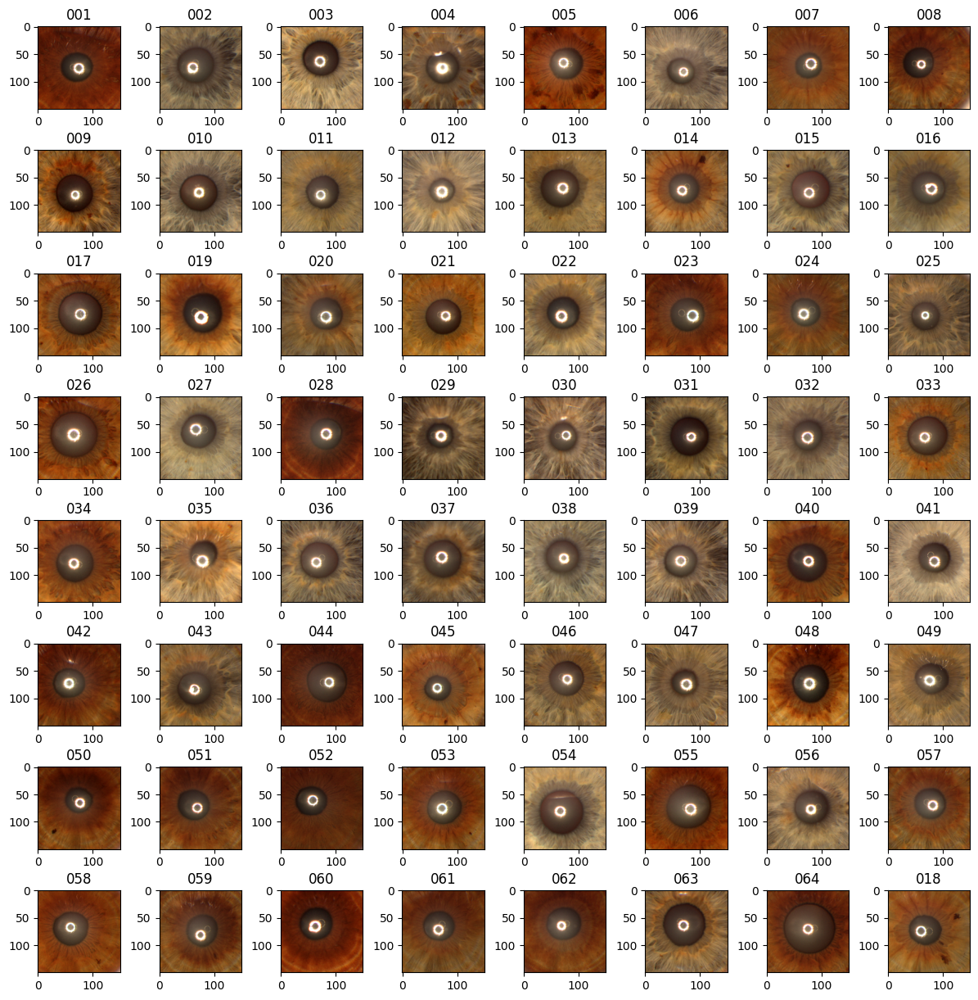

In [6]:
# задаем путь до папки с результатами
folder_path = '/content/drive/MyDrive/Dekart/Dekart64_2/'

# определяем количество столбцов и максимальное количество картинок
num_cols = 8
max_images = num_cols * num_cols

# создаем холст для отображения изображений
figure, axes = plt.subplots(nrows=num_cols, ncols=num_cols, figsize=(15,15))

# задаем расстояние между картинками на высоту подписей
figure.subplots_adjust(hspace=0.5)

image_counter = 0

# проходим по всем папкам в исходной директории
for dirpath, dirnames, filenames in os.walk(folder_path):
    # если достигли максимального количества изображений, выходим из цикла
    if image_counter >= max_images:
        break
    # если в папке есть файлы, выводим первый из них
    if len(filenames) > 0:
        selected_file = filenames[0]
        # выводим картинку на холст
        file_path = os.path.join(dirpath, selected_file)
        image = Image.open(file_path)
        axes[image_counter // num_cols, image_counter % num_cols].imshow(image)
        axes[image_counter // num_cols, image_counter % num_cols].set_title(selected_file[:3])  # изменяем подпись картинки
        image_counter += 1

# скрываем пустые ячейки на холсте
for i in range(image_counter, max_images):
    axes[i // num_cols, i % num_cols].axis('off')

plt.show()



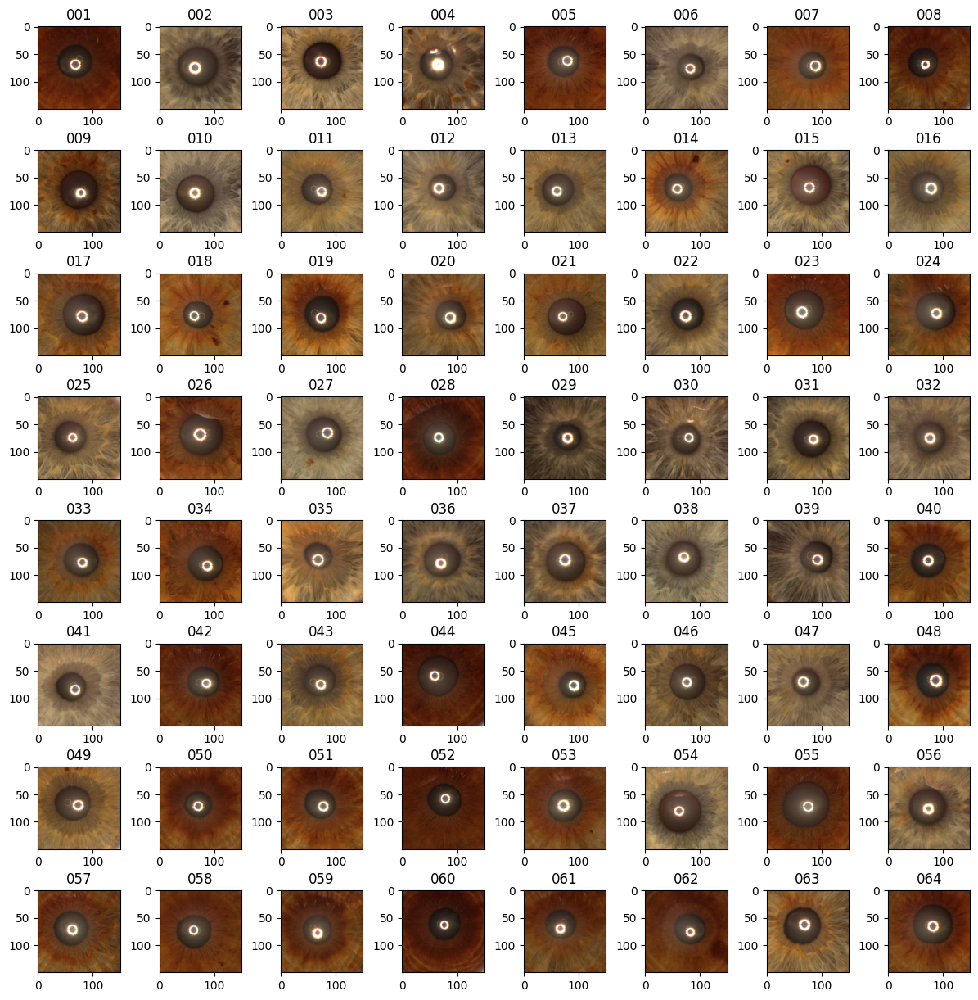

In [16]:
# задаем путь до папки с результатами
folder_path = '/content/drive/MyDrive/Dekart/test-Izm/'

# определяем количество столбцов и максимальное количество картинок
num_cols = 8
max_images = num_cols * num_cols

# создаем холст для отображения изображений
figure, axes = plt.subplots(nrows=num_cols, ncols=num_cols, figsize=(15,15))

# задаем расстояние между картинками на высоту подписей
figure.subplots_adjust(hspace=0.5)

image_counter = 0

# проходим по всем папкам в исходной директории
for dirpath, dirnames, filenames in os.walk(folder_path):
    # если достигли максимального количества изображений, выходим из цикла
    if image_counter >= max_images:
        break
    # если в папке есть файлы, выводим первый из них
    if len(filenames) > 0:
        selected_file = filenames[0]
        # выводим картинку на холст
        file_path = os.path.join(dirpath, selected_file)
        image = Image.open(file_path)
        axes[image_counter // num_cols, image_counter % num_cols].imshow(image)
        axes[image_counter // num_cols, image_counter % num_cols].set_title(selected_file[:3])  # изменяем подпись картинки
        image_counter += 1

# скрываем пустые ячейки на холсте
for i in range(image_counter, max_images):
    axes[i // num_cols, i % num_cols].axis('off')

plt.show()

In [17]:
'''
Также проверяем, данные находящиеся в загруженной базе. Для этого функцией
`listdir()` из модуля **os** получите список папок по адресу **IMAGE_PATH**:
'''

IMAGE_PATH = '/content/drive/MyDrive/Dekart/Dekart64_2'

In [18]:
# Получите список папок
os.listdir(IMAGE_PATH)

['001',
 '002',
 '003',
 '004',
 '005',
 '006',
 '007',
 '008',
 '009',
 '010',
 '011',
 '012',
 '013',
 '014',
 '015',
 '016',
 '017',
 '019',
 '020',
 '021',
 '022',
 '023',
 '024',
 '025',
 '026',
 '027',
 '028',
 '029',
 '030',
 '031',
 '032',
 '033',
 '034',
 '035',
 '036',
 '037',
 '038',
 '039',
 '040',
 '041',
 '042',
 '043',
 '044',
 '045',
 '046',
 '047',
 '048',
 '049',
 '050',
 '051',
 '052',
 '053',
 '054',
 '055',
 '056',
 '057',
 '058',
 '059',
 '060',
 '061',
 '062',
 '063',
 '064',
 '018']

Здесь видно, что файлы распределены по папкам, при этом названия папок соответствуют именам классов (маркам авто). Поэтому зададим список классов из списка папок. Функция `listdir()` возвращает список папок в неопределенном порядке, поэтому список классов желательно отсортировать, чтобы имена классов всегда шли в одном порядке. Метками классов будут индексы имен классов в списке классов. Количество классов определим как длину списка классов.

In [19]:
# Определение списка имен классов
CLASS_LIST = sorted(os.listdir(IMAGE_PATH))

# Определение количества классов
CLASS_COUNT = len(CLASS_LIST)

# Проверка результата
print(f'Количество классов: {CLASS_COUNT}, метки классов: {CLASS_LIST}')

Количество классов: 64, метки классов: ['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064']


In [20]:
i = 0

# Формирование пути к выборке одной класса
f'{IMAGE_PATH}/{CLASS_LIST[i]}/'

'/content/drive/MyDrive/Dekart/Dekart64_2/001/'

Отобразим визуально для примера по одному изображению из каждого класса (при помощи функции `imshow()` из модуля **matplotlib.pyplot**).

Для этого импортируем необходимые библиотеки, создадим заготовку для изображений всех классов.

Далее в цикле переберем все классы. Сформируем путь к классу, выберем из него один случайный экземпляр (при помощи функции `random.choice()`) и отобразим его в ячейке (получим содержимое картинки при помощи функции `open()` из модуля **Image**).

Image: 001_original_001R_1.png_a4910ef4-118d-4677-929a-e5223935c573.png, Size: (150, 150)


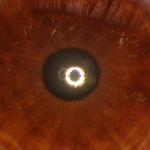

Image: 002_original_002L_3.png_4d7de5e1-e664-4a40-99ec-3c8a03da1107.png, Size: (150, 150)


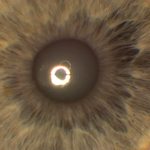

Image: 003_original_003L_3.png_b80cad7d-d646-428a-95fb-0549f9fff5e8.png, Size: (150, 150)


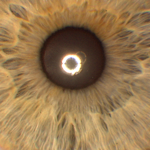

Image: 004_original_004L_3.png_92a14d2c-fbe2-410a-8f51-9f239b818618.png, Size: (150, 150)


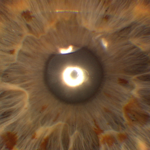

Image: 005_original_005L_3.png_bf9d8424-9785-4f68-bb38-c3db319bd7c8.png, Size: (150, 150)


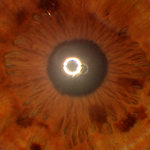

Image: 006_original_006L_1.png_6955dbab-76ac-4699-be1a-6c152b667ed8.png, Size: (150, 150)


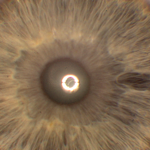

Image: 007_original_007R_1.png_21c8d2c0-b6ab-425c-b9be-2567fa174493.png, Size: (150, 150)


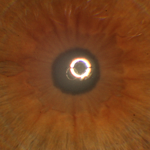

Image: 008_original_008R_2.png_443e7147-88b0-4393-9280-fab8e69897ae.png, Size: (150, 150)


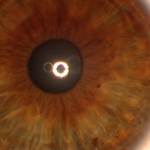

Image: 009_original_009L_3.png_84e95a6e-d475-4189-974f-b65f922fae27.png, Size: (150, 150)


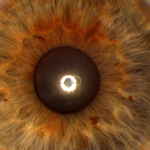

Image: 010_original_010L_2.png_d0659c94-cde9-4680-b10f-a2181bc4cd21.png, Size: (150, 150)


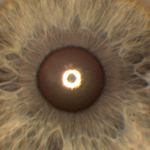

Image: 011_original_011L_2.png_dda84e3e-f115-4cc0-882b-b6f290791594.png, Size: (150, 150)


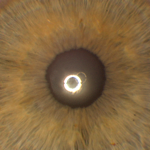

Image: 012_original_012R_3.png_7705d293-a1aa-4d93-8bd0-3daa279327cf.png, Size: (150, 150)


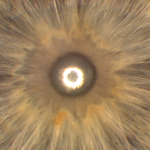

Image: 013_original_013R_1.png_ab3bdeb6-b738-4c79-a57f-8ba7f6ed775e.png, Size: (150, 150)


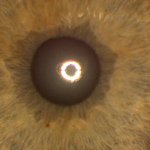

Image: 014_original_014L_1.png_a2bd22f8-b81d-4099-b197-0a039485c756.png, Size: (150, 150)


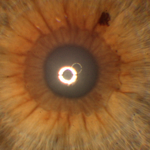

Image: 015_original_015L_3.png_b43a4af2-3860-46ed-aeb1-51ec9adfaa92.png, Size: (150, 150)


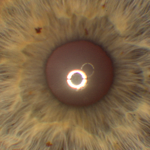

Image: 016_original_016R_1.png_4ebe55da-ee4e-44de-9f21-7802dff98ccb.png, Size: (150, 150)


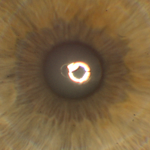

Image: 017_original_017L_2.png_128363d2-aa05-47d0-89f8-8b014e2383e9.png, Size: (150, 150)


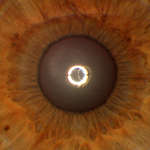

Image: 019_original_019R_1.png_1bc00419-cc16-488a-84e1-cc2355450096.png, Size: (150, 150)


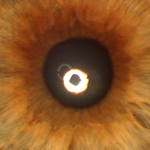

Image: 020_original_020R_3.png_0ee556c7-6aa8-4fce-b0ae-3355c5b5e1a0.png, Size: (150, 150)


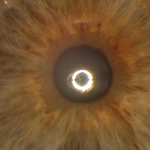

Image: 021_original_021R_2.png_9f5be9bb-6d99-4313-b3cf-8b4c3c0bbb73.png, Size: (150, 150)


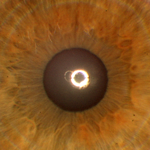

Image: 022_original_022R_2.png_d17cfb9c-7a9a-40c1-bada-ae7694030610.png, Size: (150, 150)


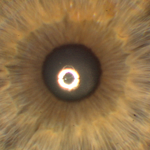

Image: 023_original_023R_2.png_7db53cb9-dbf0-4264-b493-6e650b5ffc2b.png, Size: (150, 150)


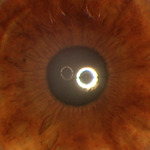

Image: 024_original_024L_3.png_f58d21c7-8534-4a0d-a320-84a2cc6f6147.png, Size: (150, 150)


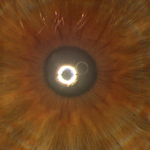

Image: 025_original_025L_3.png_82ece1bf-8435-4a0e-a5bd-a8f792e0ec1f.png, Size: (150, 150)


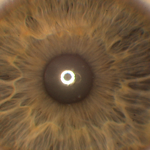

Image: 026_original_026L_1.png_5bfc8b1f-0cdd-46ac-bb80-bc34108174e1.png, Size: (150, 150)


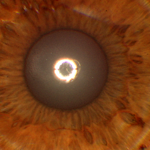

Image: 027_original_027L_2.png_7ce9eb53-c637-46ec-bb46-f68e4dc80c00.png, Size: (150, 150)


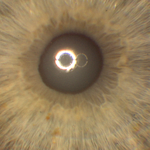

Image: 028_original_028R_3.png_00b92f44-3607-4511-8489-d54f31da906e.png, Size: (150, 150)


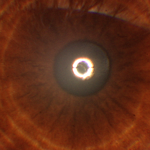

Image: 029_original_029R_3.png_45bd4eab-5328-447a-91f0-99edf8ddd77a.png, Size: (150, 150)


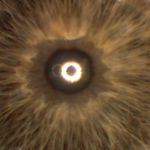

Image: 030_original_030R_1.png_51f0fb8f-51a9-4dde-9edb-067dbc9c1ae2.png, Size: (150, 150)


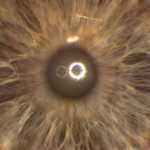

Image: 031_original_031R_1.png_63672dc6-a51d-477c-81d3-09e1d1e86762.png, Size: (150, 150)


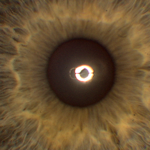

Image: 032_original_032L_3.png_a679ff28-2e12-4605-98c3-c7f1d5ab7eae.png, Size: (150, 150)


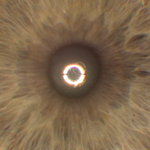

Image: 033_original_033L_2.png_3f3b10d2-a7dd-4043-954a-8eb6cfac8dc9.png, Size: (150, 150)


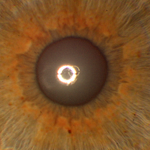

Image: 034_original_034L_3.png_77bccb64-7cb7-49e4-9716-8e057b215103.png, Size: (150, 150)


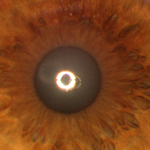

Image: 035_original_035R_1.png_79e3dcfa-2a34-44da-9786-cded43e4dd94.png, Size: (150, 150)


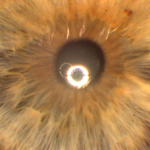

Image: 036_original_036L_1.png_a853cd8b-f077-41a8-a1d1-2b9fa5eb2a49.png, Size: (150, 150)


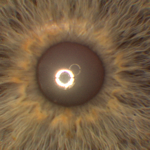

Image: 037_original_037R_3.png_4250fa9e-8568-461f-bedd-af4dd2e0e496.png, Size: (150, 150)


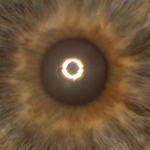

Image: 038_original_038L_1.png_8eebe7fd-6aa5-437e-b8ba-5247c2063e8e.png, Size: (150, 150)


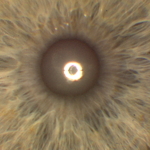

Image: 039_original_039L_2.png_1052a496-9335-4de3-b4dd-4618d8f5b1a9.png, Size: (150, 150)


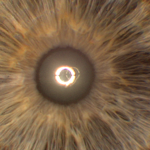

Image: 040_original_040L_1.png_d4eed238-6b14-43c1-8c79-08f1779ef5c5.png, Size: (150, 150)


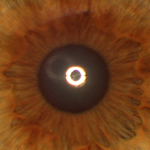

Image: 041_original_041R_1.png_9b054f1d-12d4-43c1-b64d-34c9bb66da29.png, Size: (150, 150)


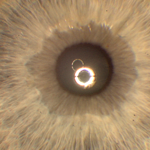

Image: 042_original_042L_3.png_503d4a7c-8032-4bac-bb76-0a49561b5110.png, Size: (150, 150)


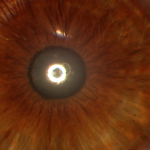

Image: 043_original_043L_3.png_625fd379-4f7e-4bd5-923b-243e2f0903b0.png, Size: (150, 150)


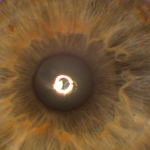

Image: 044_original_044R_1.png_79609e2e-9b0c-437c-bfbb-bf53afa1067b.png, Size: (150, 150)


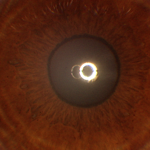

Image: 045_original_045L_1.png_35cd2e7d-1209-4927-8ae5-40086a11742c.png, Size: (150, 150)


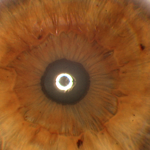

Image: 046_original_046R_3.png_1e8fac35-2a13-40a3-93c1-bbc42205071e.png, Size: (150, 150)


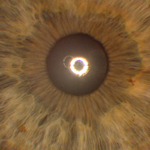

Image: 047_original_047R_3.png_b1bdae40-ef29-4b3b-b74f-bba3f53c335c.png, Size: (150, 150)


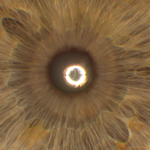

Image: 048_original_048L_3.png_1548e313-26ad-42fc-9f49-9bcfe7991613.png, Size: (150, 150)


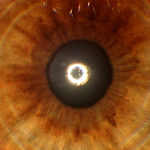

Image: 049_original_049L_3.png_f04426a9-52e6-4350-a738-2d92471f8fce.png, Size: (150, 150)


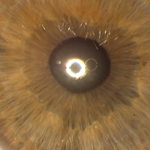

Image: 050_original_050R_3.png_c56c5576-e679-42c1-afb1-978d8fce6e33.png, Size: (150, 150)


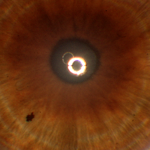

Image: 051_original_051L_3.png_074f8532-918c-426b-a39d-429a295f7300.png, Size: (150, 150)


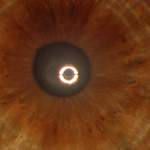

Image: 052_original_052L_2.png_558d9d49-523a-47b1-830e-89d273796a40.png, Size: (150, 150)


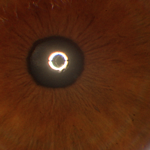

Image: 053_original_053L_2.png_7626af6c-a5f3-498c-8286-34188e4b9733.png, Size: (150, 150)


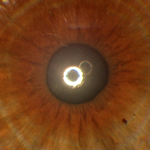

Image: 054_original_054L_3.png_b17e3676-fe65-482f-9a42-882b37826607.png, Size: (150, 150)


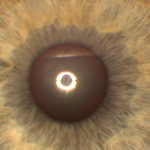

Image: 055_original_055R_3.png_f563609b-9454-4a80-a52f-0e6dce065a7d.png, Size: (150, 150)


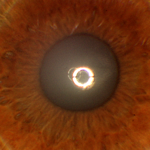

Image: 056_original_056L_3.png_e4d648da-c1eb-4d26-8e03-809497dbb320.png, Size: (150, 150)


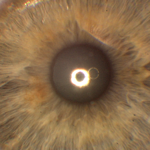

Image: 057_original_057R_1.png_29b2d3d0-9617-41c3-8478-035f094fcb50.png, Size: (150, 150)


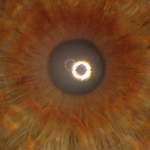

Image: 058_original_058L_2.png_6dde95ed-a168-4fcc-bf31-ae996b5f77b3.png, Size: (150, 150)


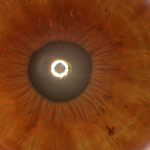

Image: 059_original_059L_1.png_25d58e35-95e9-4297-a487-3e3c31a1a389.png, Size: (150, 150)


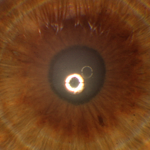

Image: 060_original_060L_3.png_1e8ccdf2-3d6c-4fcc-a6e8-8fabeee697b0.png, Size: (150, 150)


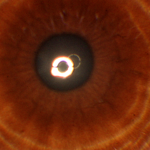

Image: 061_original_061L_2.png_b4c29b07-93a3-4a71-8748-b2f9eda93df4.png, Size: (150, 150)


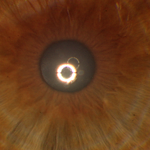

Image: 062_original_062L_2.png_b7ba79eb-0cc6-4a96-ae13-cf8fd5669e26.png, Size: (150, 150)


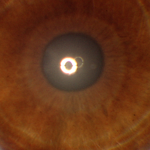

Image: 063_original_063R_1.png_2a6e196f-906d-41c8-8024-2326e0bcd1e1.png, Size: (150, 150)


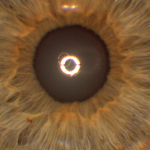

Image: 064_original_064L_1.png_800881da-d5ec-49f4-8352-259a24412275.png, Size: (150, 150)


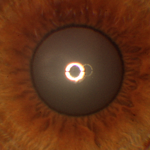

Image: 018_original_018L_2.png_bf3aeb7e-ccdd-40d7-8fb2-c6331db3c2c6.png, Size: (150, 150)


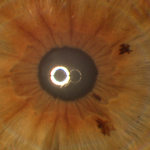

In [21]:
data_dir = '/content/drive/MyDrive/Dekart/Dekart64_2'

# Получение списка папок в каталоге
folders = [folder for folder in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, folder))]

# Показ по одной фотографии из каждой папки
for folder in folders:
    folder_path = os.path.join(data_dir, folder)
    image_names = [name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))]
    if len(image_names) > 0:
        first_image_path = os.path.join(folder_path, image_names[0])
        image = Image.open(first_image_path)
        print(f"Image: {os.path.basename(first_image_path)}, Size: {image.size}")
        image.show()

Image: 001L_2.png, Size: (150, 150)


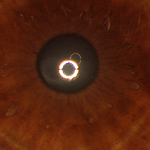

Image: 002L_1.png, Size: (150, 150)


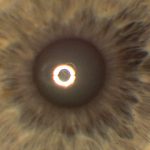

Image: 003L_1.png, Size: (150, 150)


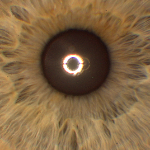

Image: 004L_1.png, Size: (150, 150)


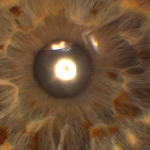

Image: 005R_1.png, Size: (150, 150)


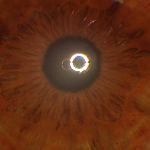

Image: 006R_1.png, Size: (150, 150)


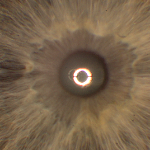

Image: 007R_3.png, Size: (150, 150)


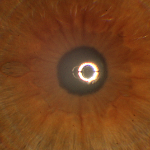

Image: 008R_3.png, Size: (150, 150)


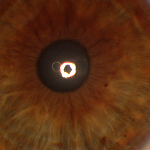

Image: 009L_2.png, Size: (150, 150)


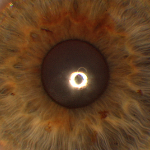

Image: 010L_3.png, Size: (150, 150)


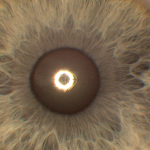

Image: 011R_3.png, Size: (150, 150)


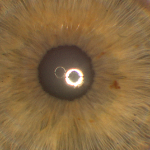

Image: 012L_3.png, Size: (150, 150)


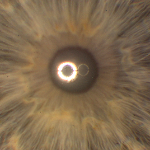

Image: 013L_1.png, Size: (150, 150)


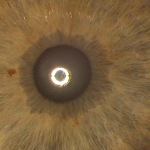

Image: 014L_3.png, Size: (150, 150)


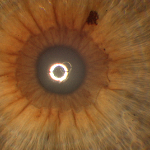

Image: 015L_1.png, Size: (150, 150)


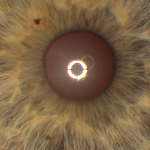

Image: 016R_3.png, Size: (150, 150)


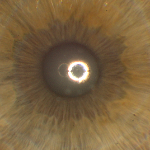

Image: 017R_3.png, Size: (150, 150)


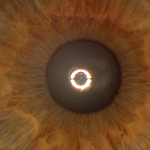

Image: 018L_3.png, Size: (150, 150)


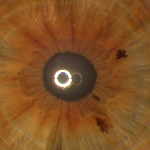

Image: 019R_2.png, Size: (150, 150)


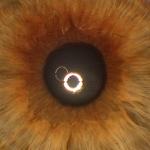

Image: 020R_2.png, Size: (150, 150)


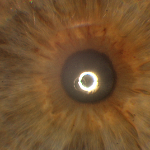

Image: 021L_2.png, Size: (150, 150)


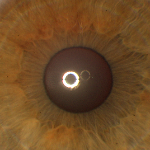

Image: 022R_1.png, Size: (150, 150)


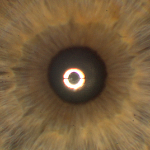

Image: 023L_1.png, Size: (150, 150)


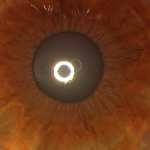

Image: 024R_2.png, Size: (150, 150)


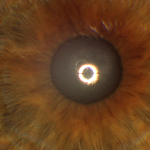

Image: 025R_1.png, Size: (150, 150)


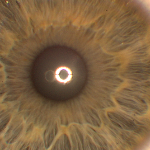

Image: 026L_2.png, Size: (150, 150)


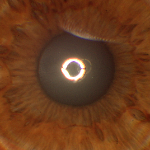

Image: 027R_3.png, Size: (150, 150)


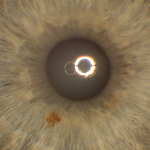

Image: 028L_2.png, Size: (150, 150)


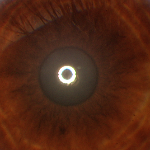

Image: 029R_2.png, Size: (150, 150)


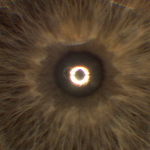

Image: 030R_2.png, Size: (150, 150)


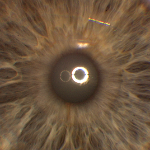

Image: 031R_3.png, Size: (150, 150)


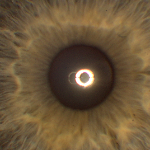

Image: 032R_3.png, Size: (150, 150)


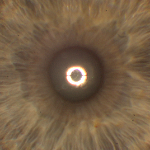

Image: 033R_2.png, Size: (150, 150)


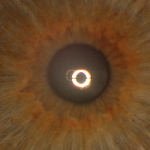

Image: 034R_2.png, Size: (150, 150)


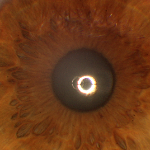

Image: 035L_2.png, Size: (150, 150)


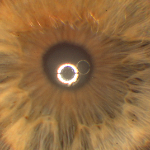

Image: 036L_2.png, Size: (150, 150)


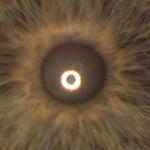

Image: 037R_2.png, Size: (150, 150)


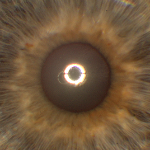

Image: 038R_1.png, Size: (150, 150)


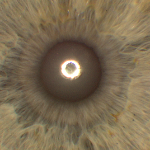

Image: 039R_3.png, Size: (150, 150)


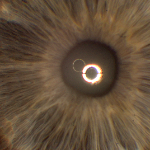

Image: 040R_2.png, Size: (150, 150)


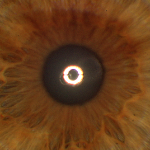

Image: 041L_1.png, Size: (150, 150)


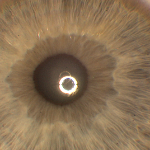

Image: 042R_3.png, Size: (150, 150)


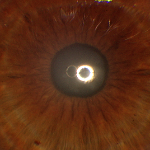

Image: 043R_1.png, Size: (150, 150)


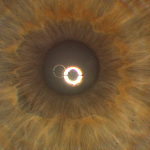

Image: 044L_1.png, Size: (150, 150)


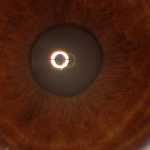

Image: 045R_1.png, Size: (150, 150)


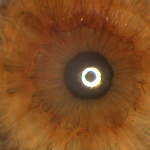

Image: 046L_1.png, Size: (150, 150)


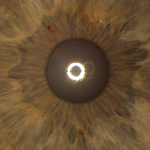

Image: 047L_3.png, Size: (150, 150)


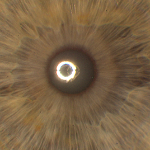

Image: 048R_1.png, Size: (150, 150)


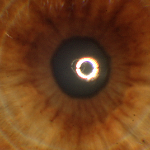

Image: 049R_3.png, Size: (150, 150)


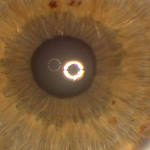

Image: 050L_1.png, Size: (150, 150)


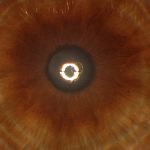

Image: 051L_2.png, Size: (150, 150)


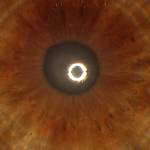

Image: 052R_1.png, Size: (150, 150)


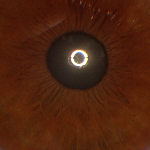

Image: 053L_3.png, Size: (150, 150)


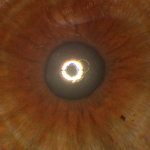

Image: 054L_2.png, Size: (150, 150)


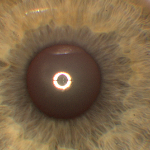

Image: 055R_1.png, Size: (150, 150)


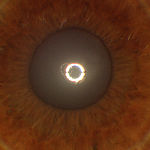

Image: 056L_2.png, Size: (150, 150)


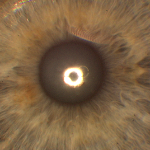

Image: 057L_2.png, Size: (150, 150)


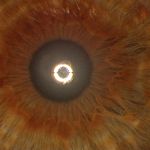

Image: 058L_1.png, Size: (150, 150)


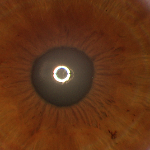

Image: 059R_3.png, Size: (150, 150)


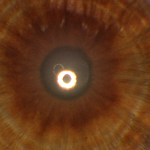

Image: 060R_2.png, Size: (150, 150)


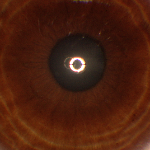

Image: 061L_3.png, Size: (150, 150)


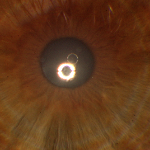

Image: 062R_1.png, Size: (150, 150)


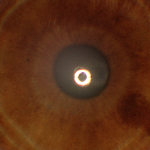

Image: 063L_2.png, Size: (150, 150)


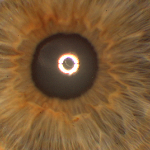

Image: 064R_1.png, Size: (150, 150)


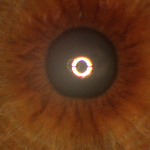

In [22]:
data_dir = '/content/drive/MyDrive/Dekart/test-Izm'

# Получение списка папок в каталоге
folders = [folder for folder in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, folder))]

# Показ по одной фотографии из каждой папки
for folder in folders:
    folder_path = os.path.join(data_dir, folder)
    image_names = [name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))]
    if len(image_names) > 0:
        first_image_path = os.path.join(folder_path, image_names[0])
        image = Image.open(first_image_path)
        print(f"Image: {os.path.basename(first_image_path)}, Size: {image.size}")
        image.show()

## Изображения

Для определения количества классов и количество картинок каждого класса,  проводим следующие действия:
1.  Создать два пустых списка:
     1.  для хранения путей к файлам изображений.
     2.  для хранения меток классов (названий папок).
2.  Получить список папок, содержащихся в директории 'Dekart64_2' и 'test-Izm'.
3.  Для каждой папки пройтись по всем файлам внутри нее и добавить путь к файлу в первый список, а метку (название категории) во второй список.
4.  Выводим на экран количество изображений в каждой папке и имя папки.

Для формирования, выборок проводим следующие действия:
1.  Создаем пустые списоки для изображений.
2.  Проходи по списку image_paths, открыв каждое изображение,
3.  Приведя его к формату 150 на 150 пикселей
4.  Приведя его к формату 64 на 64 пикселя
5.  Добавив изображение в пустой список в виде numpy массива.
6.  Cписок меток классов переводим в формат numpy массива.

Далее производим деление данных на выборки

Результатом блока являются файлы:
1.  для формата изображения 64/64
     x_train64_g, y_train64_g, x_val64_g, y_val64_g,
     x_test64_g, y_test64_g.
2.  для формата изображения 150/150
     x_train_g, y_train_g, x_val_g, y_val_g,
     x_test_g, y_test_g.

In [23]:
# Создаем пустые списки для хранения путей к файлам изображений и меток классов
image_paths = []
labels = []

# Получаем список папок, содержащихся в директории '/Dekart64_2/'
dir_path = '/content/drive/MyDrive/Dekart/Dekart64_2'
categories = os.listdir(dir_path)

# Проходим по каждой папке и добавляем в списки путь к файлу изображения и метку класса
for category in categories:
    category_path = os.path.join(dir_path, category)
    if os.path.isdir(category_path):
        files = os.listdir(category_path)
        print(f"Number of images in '{category}': {len(files)}")
        for file_name in files:
            file_path = os.path.join(category_path, file_name)
            image_paths.append(file_path)
            labels.append(category)

# Выводим результаты
print("Total number of images:", len(image_paths))
print("Total number of labels:", len(labels))


Number of images in '001': 65
Number of images in '002': 65
Number of images in '003': 65
Number of images in '004': 65
Number of images in '005': 65
Number of images in '006': 65
Number of images in '007': 65
Number of images in '008': 65
Number of images in '009': 65
Number of images in '010': 65
Number of images in '011': 65
Number of images in '012': 65
Number of images in '013': 65
Number of images in '014': 65
Number of images in '015': 65
Number of images in '016': 65
Number of images in '017': 65
Number of images in '019': 65
Number of images in '020': 65
Number of images in '021': 65
Number of images in '022': 65
Number of images in '023': 65
Number of images in '024': 65
Number of images in '025': 65
Number of images in '026': 65
Number of images in '027': 65
Number of images in '028': 65
Number of images in '029': 65
Number of images in '030': 65
Number of images in '031': 65
Number of images in '032': 65
Number of images in '033': 65
Number of images in '034': 65
Number of 

In [24]:
# Создаем пустые списки для хранения путей к файлам изображений и меток классов
test_image_paths = []
test_labels = []

# Получаем список папок, содержащихся в директории '/content/drive/MyDrive/Dekart/test-Izm'
test_dir_path = '/content/drive/MyDrive/Dekart/test-Izm'
test_categories = os.listdir(test_dir_path)

# Проходим по каждой папке и добавляем в списки путь к файлу изображения и метку класса
for category in test_categories:
    category_path = os.path.join(test_dir_path, category)
    if os.path.isdir(category_path):
        files = os.listdir(category_path)
        print(f"Number of images in '{category}': {len(files)}")
        for file_name in files:
            file_path = os.path.join(category_path, file_name)
            test_image_paths.append(file_path)
            test_labels.append(category)

# Выводим результаты
print("Total number of test images:", len(test_image_paths))
print("Total number of test labels:", len(test_labels))

Number of images in '001': 1
Number of images in '002': 1
Number of images in '003': 1
Number of images in '004': 1
Number of images in '005': 1
Number of images in '006': 1
Number of images in '007': 1
Number of images in '008': 1
Number of images in '009': 1
Number of images in '010': 1
Number of images in '011': 1
Number of images in '012': 1
Number of images in '013': 1
Number of images in '014': 1
Number of images in '015': 1
Number of images in '016': 1
Number of images in '017': 1
Number of images in '018': 1
Number of images in '019': 1
Number of images in '020': 1
Number of images in '021': 1
Number of images in '022': 1
Number of images in '023': 1
Number of images in '024': 1
Number of images in '025': 1
Number of images in '026': 1
Number of images in '027': 1
Number of images in '028': 1
Number of images in '029': 1
Number of images in '030': 1
Number of images in '031': 1
Number of images in '032': 1
Number of images in '033': 1
Number of images in '034': 1
Number of imag

In [25]:
# Создаем экземпляр LabelEncoder и преобразуем лейблы в числовой формат
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(labels)

# Создаем экземпляр OneHotEncoder и преобразуем числовые значения в One-Hot Encoding
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded = onehot_encoder.fit_transform(integer_encoded)

# Выводим результат
print(onehot_encoded)

[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [26]:
# Создаем экземпляр LabelEncoder и преобразуем лейблы в числовой формат
test_label_encoder = LabelEncoder()
test_integer_encoded = test_label_encoder.fit_transform(test_labels)

# Создаем экземпляр OneHotEncoder и преобразуем числовые значения в One-Hot Encoding
test_onehot_encoder = OneHotEncoder(sparse=False)
test_integer_encoded = test_integer_encoded.reshape(len(test_integer_encoded), 1)
test_onehot_encoded = test_onehot_encoder.fit_transform(test_integer_encoded)

# Выводим результат
print(test_onehot_encoded)

[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Этот код сначала создает экземпляр LabelEncoder, который преобразует лейблы в числовой формат. Затем создается экземпляр OneHotEncoder, который преобразует числовые значения в формат One-Hot Encoding. Наконец, преобразованные данные выводятся на экран.

In [ ]:
onehot_encoded[6]

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

Для выполнения задачи нужно выполнить следующие шаги:

1.  Создаем пустые списоки для изображений.
2.  Проходи по списку image_paths, открыв каждое изображение,
3.  Приведя его к формату 150 на 150 пикселей
4.  Приведя его к формату 64 на 64 пикселя
5.  Добавив изображение в пустой список в виде numpy массива.
6.  Cписок меток классов переводим в формат numpy массива.

In [27]:
# Создаем пустой список для изображений
imagesALL = []

# Проходим по каждому пути к файлу изображения и добавляем его в список
for path in image_paths:
    with Image.open(path) as img:
        img = img.resize((150, 150)) # изменяем размер изображения до 150x150 пикселей
        img = np.array(img) # приводим изображение к формату numpy массива
        imagesALL.append(img) # добавляем изображение в список

# Преобразуем список в формат numpy массива
imagesALL = np.array(imagesALL)

# Преобразуем список меток классов в формат numpy массива

labels_onehotALL = np.array(onehot_encoded)

# Выводим размерности массивов с изображениями и метками классов
print("Shape of images array:", imagesALL.shape)
print("Shape of labels array:", labels_onehotALL.shape)

images64 = []

# Проходим по каждому пути к файлу изображения и добавляем его в список
for path in image_paths:
    with Image.open(path) as img:
        img = img.resize((64, 64)) # изменяем размер изображения до 64x64 пикселей
        img = np.array(img) # приводим изображение к формату numpy массива
        images64.append(img) # добавляем изображение в список

# Преобразуем список в формат numpy массива
images64 = np.array(images64)

# Преобразуем список меток классов в формат numpy массива

labels_onehot64 = np.array(onehot_encoded)

# Выводим размерности массивов с изображениями и метками классов
print("Shape of images array:", images64.shape)
print("Shape of labels array:", labels_onehot64.shape)


Shape of images array: (4160, 150, 150, 3)
Shape of labels array: (4160, 64)
Shape of images array: (4160, 64, 64, 3)
Shape of labels array: (4160, 64)


In [28]:
# Создаем пустой список для изображений
test_images64 = []

# Проходим по каждому пути к файлу изображения и добавляем его в список
for path in test_image_paths:
    with Image.open(path) as img:
        img = img.resize((64, 64)) # изменяем размер изображения до 64x64 пикселей
        img = np.array(img) # приводим изображение к формату numpy массива
        test_images64.append(img) # добавляем изображение в список

# Преобразуем список в формат numpy массива
test_images64 = np.array(test_images64)

# Преобразуем список меток классов в формат numpy массива
test_labels_onehot64 = np.array(test_onehot_encoded)

# Выводим размерности массивов с изображениями и метками классов
print("Shape of test images array:", test_images64.shape)
print("Shape of test labels array:", test_labels_onehot64.shape)
# Создаем пустой список для изображений
test_imagesALL = []

# Проходим по каждому пути к файлу изображения и добавляем его в список
for path in test_image_paths:
    with Image.open(path) as img:
        img = img.resize((150, 150)) # изменяем размер изображения до 150x150 пикселей
        img = np.array(img) # приводим изображение к формату numpy массива
        test_imagesALL.append(img) # добавляем изображение в список

# Преобразуем список в формат numpy массива
test_imagesALL = np.array(test_imagesALL)

# Преобразуем список меток классов в формат numpy массива
test_labels_onehotALL = np.array(test_onehot_encoded)

# Выводим размерности массивов с изображениями и метками классов
print("Shape of test images array:", test_imagesALL.shape)
print("Shape of test labels array:", test_labels_onehotALL.shape)

Shape of test images array: (64, 64, 64, 3)
Shape of test labels array: (64, 64)
Shape of test images array: (64, 150, 150, 3)
Shape of test labels array: (64, 64)


In [29]:
# Нормируем массив изображений
test_images_normalized64 = test_images64   / 255.0
test_images_normalizedALL = test_imagesALL / 255.0
images_normalized64       = images64       / 255.0
images_normalizedALL      = imagesALL      / 255.0

# Выводим результат
print(test_images_normalized64[0])
print(test_images_normalizedALL[0])
print(images_normalized64[0])
print(images_normalizedALL[0])

[[[0.34901961 0.1254902  0.03921569]
  [0.38823529 0.1254902  0.04313725]
  [0.41568627 0.16078431 0.05490196]
  ...
  [0.38823529 0.16078431 0.05490196]
  [0.4        0.17254902 0.05490196]
  [0.39607843 0.16470588 0.05098039]]

 [[0.4        0.15294118 0.04313725]
  [0.39215686 0.14901961 0.03921569]
  [0.39215686 0.15686275 0.05490196]
  ...
  [0.37254902 0.15294118 0.05098039]
  [0.36470588 0.14509804 0.04705882]
  [0.39215686 0.17254902 0.04705882]]

 [[0.42352941 0.18039216 0.05490196]
  [0.37647059 0.14117647 0.04313725]
  [0.38039216 0.13333333 0.03921569]
  ...
  [0.35686275 0.14117647 0.03137255]
  [0.37254902 0.1372549  0.03921569]
  [0.38039216 0.16078431 0.05490196]]

 ...

 [[0.38431373 0.14117647 0.05490196]
  [0.38431373 0.14117647 0.05098039]
  [0.4        0.14901961 0.04705882]
  ...
  [0.43529412 0.16078431 0.05098039]
  [0.45098039 0.17254902 0.0627451 ]
  [0.4627451  0.19215686 0.0627451 ]]

 [[0.36470588 0.15686275 0.07058824]
  [0.36862745 0.1372549  0.0627451 ]


In [30]:
# Разделяем данные на тренировочную и тестовую выборки
x_train_g, x_val_g, y_train_g, y_val_g = train_test_split(imagesALL, labels_onehotALL, test_size=0.2, stratify=labels_onehotALL)
x_test_g, y_test_g =  test_imagesALL, test_labels_onehotALL
# Выводим размеры тренировочной и тестовой выборок
print("X_train shape:", x_train_g.shape)
print("y_train shape:", y_train_g.shape)
print("X_val shape:", x_val_g.shape)
print("y_val shape:", y_val_g.shape)
print("X_test shape:", x_test_g.shape)
print("y_test shape:", y_test_g.shape)

# Разделяем данные на тренировочную и тестовую выборки
x_train64_g, x_val64_g, y_train64_g, y_val64_g = train_test_split(images64, labels_onehot64, test_size=0.2, stratify=labels_onehot64)
x_test64_g, y_test64_g =  test_images64, test_labels_onehot64
# Выводим размеры тренировочной и тестовой выборок
print("X_train shape:", x_train64_g.shape)
print("y_train shape:", y_train64_g.shape)
print("X_val shape:", x_val64_g.shape)
print("y_val shape:", y_val64_g.shape)
print("X_test shape:", x_test64_g.shape)
print("y_test shape:", y_test64_g.shape)



X_train shape: (3328, 150, 150, 3)
y_train shape: (3328, 64)
X_val shape: (832, 150, 150, 3)
y_val shape: (832, 64)
X_test shape: (64, 150, 150, 3)
y_test shape: (64, 64)
X_train shape: (3328, 64, 64, 3)
y_train shape: (3328, 64)
X_val shape: (832, 64, 64, 3)
y_val shape: (832, 64)
X_test shape: (64, 64, 64, 3)
y_test shape: (64, 64)


## Cохранение и дальнейшая загрузка данных для создания нейронных сетей

In [ ]:
np.save('/content/drive/MyDrive/Dekart/x_train_g'    , x_train_g)
np.save('/content/drive/MyDrive/Dekart/y_train_g'    , y_train_g)
np.save('/content/drive/MyDrive/Dekart/x_val_g'      , x_val_g)
np.save('/content/drive/MyDrive/Dekart/y_val_g'      , y_val_g)
np.save('/content/drive/MyDrive/Dekart/x_test_g'     , x_test_g)
np.save('/content/drive/MyDrive/Dekart/y_test_g'     , y_test_g)

np.save('/content/drive/MyDrive/Dekart/x_train64_g'    , x_train64_g)
np.save('/content/drive/MyDrive/Dekart/y_train64_g'    , y_train64_g)
np.save('/content/drive/MyDrive/Dekart/x_val64_g'      , x_val64_g)
np.save('/content/drive/MyDrive/Dekart/y_val64_g'      , y_val64_g)
np.save('/content/drive/MyDrive/Dekart/x_test64_g'     , x_test64_g)
np.save('/content/drive/MyDrive/Dekart/y_test64_g'      , y_test64_g)

In [ ]:
print("x_train64_g shape:", x_train64_g.shape)
print("y_train64_g shape:", y_train64_g.shape)
print("x_val64_g shape:"  , x_val64_g.shape)
print("y_val64_g shape:"  , y_val64_g.shape)
print("x_test64_g shape:" , x_test64_g.shape)
print("y_test64_g shape:" , y_test64_g.shape)
print("x_train_g shape:"  , x_train_g.shape)
print("y_train_g shape:"  , y_train_g.shape)
print("x_val_g shape:"    , x_val_g.shape)
print("y_val_g shape:"    , y_val_g.shape)
print("x_test_g shape:"   , x_test_g.shape)
print("y_test_g shape:"   , y_test_g.shape)

x_train64_g shape: (2304, 64, 64, 3)
y_train64_g shape: (2304, 64)
x_val64_g shape: (576, 64, 64, 3)
y_val64_g shape: (576, 64)
x_test64_g shape: (64, 64, 64, 3)
y_test64_g shape: (64, 64)
x_train_g shape: (2304, 150, 150, 3)
y_train_g shape: (2304, 64)
x_val_g shape: (576, 150, 150, 3)
y_val_g shape: (576, 64)
x_test_g shape: (64, 150, 150, 3)
y_test_g shape: (64, 64)


In [3]:
x_train_g   =             np.load('/content/drive/MyDrive/Dekart/x_train_g.npy')
y_train_g   =             np.load('/content/drive/MyDrive/Dekart/y_train_g.npy')
x_val_g     =             np.load('/content/drive/MyDrive/Dekart/x_val_g.npy')
y_val_g     =             np.load('/content/drive/MyDrive/Dekart/y_val_g.npy')
x_test_g    =             np.load('/content/drive/MyDrive/Dekart/x_test_g.npy')
y_test_g    =             np.load('/content/drive/MyDrive/Dekart/y_test_g.npy')

x_train64_g =             np.load('/content/drive/MyDrive/Dekart/x_train64_g.npy')
y_train64_g =             np.load('/content/drive/MyDrive/Dekart/y_train64_g.npy')
x_val64_g   =             np.load('/content/drive/MyDrive/Dekart/x_val64_g.npy')
y_val64_g   =             np.load('/content/drive/MyDrive/Dekart/y_val64_g.npy')
x_test64_g  =             np.load('/content/drive/MyDrive/Dekart/x_test64_g.npy')
y_test64_g  =             np.load('/content/drive/MyDrive/Dekart/y_test64_g.npy')

#Начало экспериментов

#Получаем архитектуру модели и используемые в ней параметры
В данном примере мы используем библиотеку AutoKeras для создания и обучения
модели классификации изображений. Сначала мы преобразуем мультиклассовые метки
в мультиэтикеточные с помощью OneHotEncoder.
Затем мы определяем inputs и outputs для модели. Затем мы определяем
inputs и outputs для модели.
Мы используем метод ImageInput() для создания input_node, а затем поочередно
применяем блоки для нормализации, сверточных слоев, плотных слоев и блок для
классификации, чтобы определить выходной узел output_node.
Затем мы создаем объект AutoModel, передавая inputs и outputs, и указываем
параметры для поиска наилучшей модели (max_trials и objective).
Мы обучаем модель на тренировочных данных, используя validation_data для
оценки производительности на валидационных данных. Мы также добавляем раннюю
остановку, чтобы избежать переобучения.
После обучения мы сохраняем модель в формате Tensorflow SavedModel и оцениваем
ее производительность на тестовых данных.
Целю нейронной сети является достижения точности > 97% на проверочной выборке.
Наконец, мы выводим структуру модели и точность модели на тестовых данных.

обучение проводятся на развернутых данных в плоскость в формате изображения
64/64:
> x_train64_g, y_train64_g, x_val64_g, y_val64_g, x_test64_g, y_test64_g.
обучение проводятся на развернутых данных в плоскость в формате изображения
150/150:
> x_train_g, y_train_g, x_val_g, y_val_g, x_test_g, y_test_g.


In [ ]:
import tensorflow as tf
import autokeras as ak
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Создание экземпляра ImageClassifier с максимальным количеством попыток перебора гиперпараметров, равным 50
clf = ak.ImageClassifier(
    overwrite=True,
    max_trials=2,
    objective="val_accuracy"
)

# Обучение модели
history = clf.fit(
    x_train64_g,
    y_train64_g,
    validation_data=(x_val64_g, y_val64_g),
    epochs=15,
    callbacks=[tf.keras.callbacks.EarlyStopping(
        patience=5,
        restore_best_weights=True
    )]
)

# Проверка точности модели на валидационном наборе данных
if history is not None and 'val_accuracy' in history.history:
    val_accuracy = history.history['val_accuracy'][-1]
    print('Validation accuracy:', val_accuracy)
else:
    val_accuracy = 0
    print('No history found.')
# Сохранение весов модели
clf.export_model().save('/content/drive/MyDrive/Dekart/model_04.07.1_final')



Trial 2 Complete [00h 03m 29s]
val_accuracy: 0.8728693127632141

Best val_accuracy So Far: 0.9992897510528564
Total elapsed time: 00h 03m 43s


No history found.


2/2 [==============================] - 0s 8ms/step - loss: 0.2027 - accuracy: 0.9219
Accuracy on test data: 92.19%


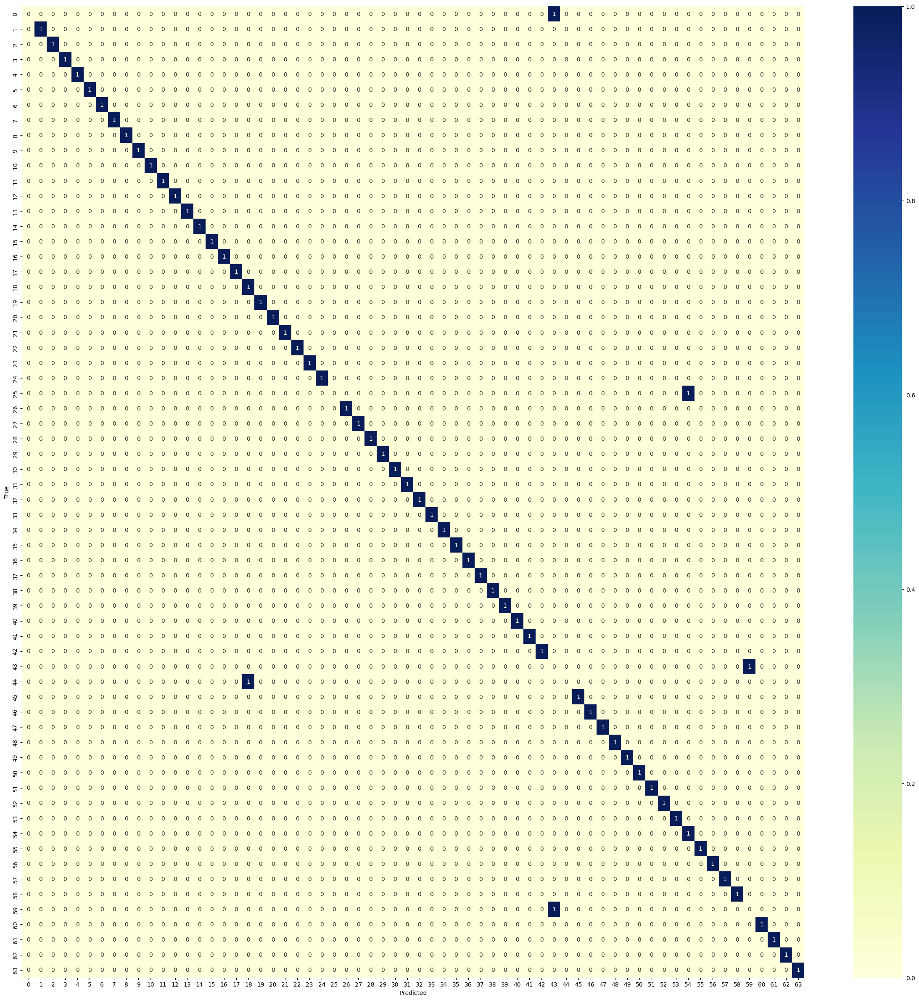

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 cast_to_float32 (CastToFloa  (None, 64, 64, 3)        0         
 t32)                                                            
                                                                 
 normalization (Normalizatio  (None, 64, 64, 3)        7         
 n)                                                              
                                                                 
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 32)       0         
 )                                                               
                                                             

In [ ]:
from tensorflow import keras

# Загрузка сохраненной модели
model = tf.keras.models.load_model('/content/drive/MyDrive/Dekart/model_04.07.1_final')

# Выполнение предсказаний на тестовой выборке
y_pred = model.predict(x_test64_g)

# Вычисление точности (accuracy) на тестовой выборке
accuracy = model.evaluate(x_test64_g, y_test64_g)[1]
print("Accuracy on test data: {:.2%}".format(accuracy))

# Вычисление матрицы ошибок
y_test128_classes = [tf.argmax(y_test64_g[i]).numpy() for i in range(len(y_test64_g))]
y_pred_classes = [tf.argmax(y_pred[i]).numpy() for i in range(len(y_pred))]
confusion_mtx = confusion_matrix(y_test128_classes, y_pred_classes)

# Отображение матрицы ошибок в графическом виде
plt.figure(figsize=(30,30))
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Вывод структуры модели
model.summary()

In [6]:
import tensorflow as tf
import autokeras as ak

# Создание экземпляра ImageClassifier с максимальным количеством попыток перебора гиперпараметров, равным 10
clf = ak.ImageClassifier(
    overwrite=True,
    max_trials=10,
    objective="val_accuracy",
    tuner='random'
)

# Обучение модели
history = clf.fit(
    x_train64_g,
    y_train64_g,
    validation_data=(x_val64_g, y_val64_g),
    epochs=15,
    callbacks=[tf.keras.callbacks.EarlyStopping(
        patience=5,
        restore_best_weights=True
    )]
)

# Проверка точности модели на валидационном наборе данных
if history is not None and 'val_accuracy' in history.history:
    val_accuracy = history.history['val_accuracy'][-1]
    print('Validation accuracy:', val_accuracy)
else:
    val_accuracy = 0
    print('No history found.')

# Сохранение весов модели
clf.export_model().save('/content/drive/MyDrive/Dekart/model_04.07.1_final')

Trial 10 Complete [00h 00m 35s]
val_accuracy: 0.3671875

Best val_accuracy So Far: 0.9964488744735718
Total elapsed time: 00h 15m 09s


No history found.


2/2 [==============================] - 1s 23ms/step - loss: 0.2313 - accuracy: 0.9375
Accuracy on test data: 93.75%


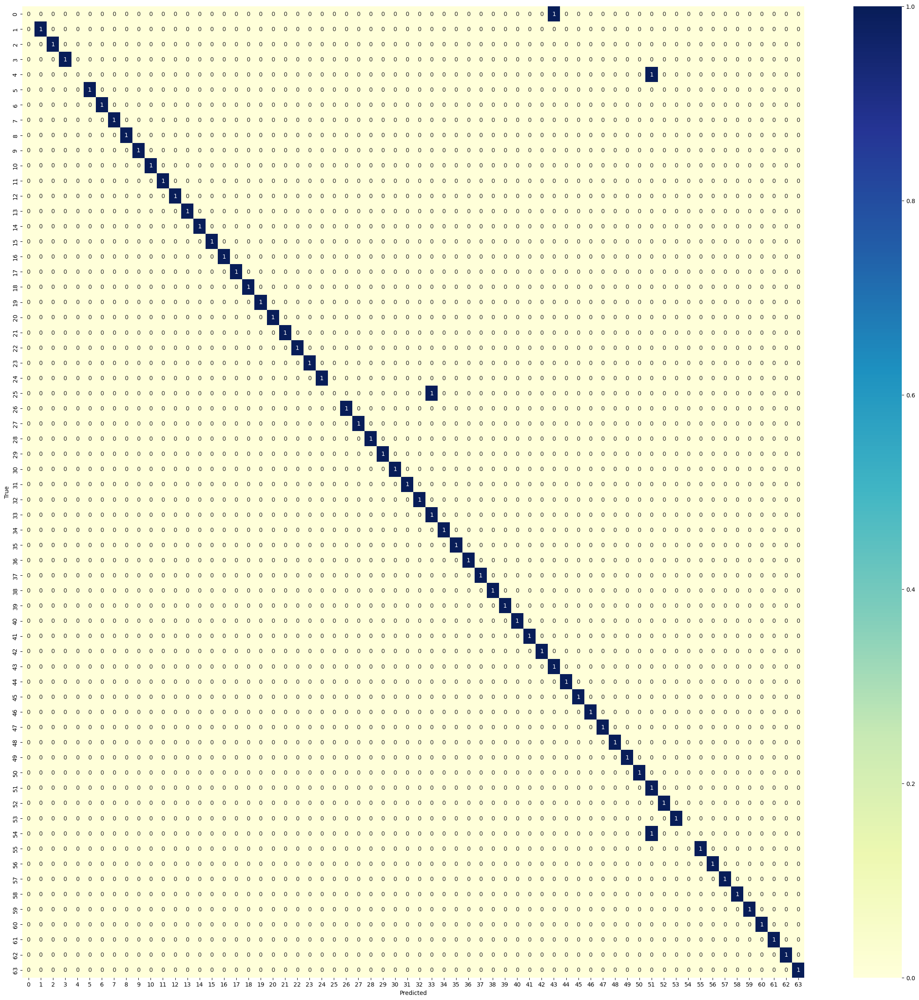

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 cast_to_float32 (CastToFloa  (None, 64, 64, 3)        0         
 t32)                                                            
                                                                 
 resizing (Resizing)         (None, 224, 224, 3)       0         
                                                                 
 xception (Functional)       (None, None, None, 2048)  20861480  
                                                                 
 global_max_pooling2d (Globa  (None, 2048)             0         
 lMaxPooling2D)                                                  
                                                                 
 dropout (Dropout)           (None, 2048)              0     

In [7]:
from tensorflow import keras

# Загрузка сохраненной модели
model = tf.keras.models.load_model('/content/drive/MyDrive/Dekart/model_04.07.1_final')

# Выполнение предсказаний на тестовой выборке
y_pred = model.predict(x_test64_g)

# Вычисление точности (accuracy) на тестовой выборке
accuracy = model.evaluate(x_test64_g, y_test64_g)[1]
print("Accuracy on test data: {:.2%}".format(accuracy))

# Вычисление матрицы ошибок
y_test128_classes = [tf.argmax(y_test64_g[i]).numpy() for i in range(len(y_test64_g))]
y_pred_classes = [tf.argmax(y_pred[i]).numpy() for i in range(len(y_pred))]
confusion_mtx = confusion_matrix(y_test128_classes, y_pred_classes)

# Отображение матрицы ошибок в графическом виде
plt.figure(figsize=(30,30))
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Вывод структуры модели
model.summary()

# Дообучение нейронки на новых данных


### загрузка и подготовка данных для подачи в нейронку.

In [ ]:
def ring_to_rect(image):
  """
  Данная функция для развертки круга в плоскость
  :param image: входное изображение типа numpy.ndarray
  :return: развернутое изображение типа numpy.ndarray
  """
  size = image.shape[0]  # размер изображения

  outer_radius = size // 3.2  # внешний радиус
  inner_radius_factor = 0.52  # коэффициент внутреннего радиуса относительно внешнего

  # Разворачиваем кольцо
  warped = cv2.warpPolar(image, (size, int(size * math.pi)), (size // 2, size // 2), outer_radius, 0)
  # Поворачиваем на 90 градусов
  straightened = cv2.rotate(warped, cv2.ROTATE_90_COUNTERCLOCKWISE)
  # Обрезаем
  cropped = straightened[: int(straightened.shape[0] * (1 - inner_radius_factor)), :]

  return cropped

def crop_white_corners(img):
    '''
    Обрезает верхнюю и нижнюю части изображения относительно центра.

    Args:
        img: входное изображение

    Returns:
        измененное изображение
    '''
    # получаем высоту изображения
    height = img.shape[0]

    # определяем высоту области для обрезки
    crop_height = int(height * 0.02)

    # вычисляем координаты области для обрезки
    y_top = crop_height
    y_bottom = height - crop_height

    # обрезаем верхнюю и нижнюю части изображения
    cropped_img = img[y_top:y_bottom, :]

    return cropped_img


# Функция для преобразования изображения в декартову систему координат
def cartesian_warp(img):
    height, width = img.shape[:-1]
    cartImg = np.zeros((height, width, 3), dtype=np.uint8)

    for y in range(height):
        for x in range(width):
            # Преобразуем координаты (x,y) в полярные координаты (r,theta)
            r = np.sqrt((x - width / 2)**2 + (y - height / 2)**2)
            theta = np.arctan2(y - height / 2, x - width / 2)

            # Вычисляем соответствующие координаты в декартовой системе координат
            xcart = int(2*r * np.cos(theta) + width / 2)
            ycart = int(2*r * np.sin(theta) + height / 2)

            # Копируем значения пикселей из исходного изображения в новое изображение
            if xcart >= 0 and xcart < width and ycart >= 0 and ycart < height:
                cartImg[y, x] = img[ycart, xcart]

    return cartImg


def unwrap_circular_image(image):
    # Берем центр изображения
    height, width = image.shape[:2]
    center_x, center_y = width // 2, height // 2

    # Вычисляем максимальный радиус окружности
    max_radius = min(center_x, center_y)

    # Вычисляем минимальный радиус, чтобы обрезать изображение по краям
    min_radius = int(max_radius * 0.6)

    # Создаем новое изображение с теми же размерами, что и исходное изображение.
    unwrapped_image = np.zeros((2 * min_radius, 2 * min_radius, 3), dtype=np.uint8)

    # Итерируемся по каждому пикселю в новом изображении
    for y in range(unwrapped_image.shape[0]):
        for x in range(unwrapped_image.shape[1]):
            # Преобразуем координаты (x, y) в полярные
            r = np.sqrt((x - min_radius) ** 2 + (y - min_radius) ** 2)
            theta = np.arctan2(y - min_radius, x - min_radius)

            # Вычисляем соответствующие (x, y) координаты в исходном изображении
            orig_x = int(center_x + r * np.cos(theta))
            orig_y = int(center_y + r * np.sin(theta))

            # Копируем значение пикселя из исходного изображения в новое изображение.
            if orig_x >= 0 and orig_x < width and orig_y >= 0 and orig_y < height:
                unwrapped_image[y, x] = image[orig_y, orig_x]

    return unwrapped_image

In [ ]:
# Разархивация датасета в директорию '/content/drive/MyDrive/Dekart'
!unzip -qo "/content/drive/MyDrive/Dekart/Iris1920x1080.zip" -d /content/drive/MyDrive/Dekart/Iris1920x1080/
# Указываем путь к архиву и название папки, в которую нужно распаковать
zip_path = "/content/drive/MyDrive/Dekart/Iris1920x1080.zip"
# Папка с папками картинок, рассортированных по категориям
dir_path = '/content/drive/MyDrive/Dekart/Iris1920x1080/'
# задаем путь до папки с результатами
folder_path = '/content/drive/MyDrive/Dekart/Iris1920x1080/'

# создаем новую папку для тестирования
test_folder_path = '/content/drive/MyDrive/Dekart/test1920x1080'

if not os.path.exists(test_folder_path):
    os.makedirs(test_folder_path)
# проходим по всем папкам в исходной директории
for dirpath, dirnames, filenames in os.walk(folder_path):
    # если в папке есть файлы, выбираем случайный и перемещаем его в новую папку
    if len(filenames) > 0:
        selected_file = random.choice(filenames)
        # создаем новую папку с таким же названием, как исходная
        new_dir_path = os.path.join(test_folder_path, os.path.basename(dirpath))
        if not os.path.exists(new_dir_path):
            os.makedirs(new_dir_path)
        # перемещаем выбранный файл в новую папку
        src_file_path = os.path.join(dirpath, selected_file)
        dst_file_path = os.path.join(new_dir_path, selected_file)
        shutil.move(src_file_path, dst_file_path)


# новая папка для сохранения результатов
new_dir_path = '/content/drive/MyDrive/Dekart/Iris1920x1080_1'
# проходим по каждому файлу в папке с изображениями
for foldername in os.listdir(dir_path):
    folder_path = os.path.join(dir_path, foldername)

    # если текущий элемент - папка, проходим по файлам внутри
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)

            # проверяем, что файл является изображением
            if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
                # загружаем изображение
                img = cv2.imread(file_path)

                # производим развертку в декартову систему координат
                img_resized = cartesian_warp(img)

                # обрезаем углы светлого цвета на изображении
                img_cropped = crop_white_corners(img)

                # Производим развертку изображения в плоскость
                img_rect = ring_to_rect(img_cropped)

                # сохраняем изображение в новую папку
                new_folder_path = os.path.join(new_dir_path, foldername)
                if not os.path.exists(new_folder_path):
                    os.makedirs(new_folder_path)
                cv2.imwrite(os.path.join(new_folder_path, filename), img_rect)

#Создаем генератор аугментация
dir_path = '/content/drive/MyDrive/Dekart/Iris1920x1080_1'

'''
    Код сначала распакует архив в папку "/content/drive/MyDrive/Dekart/Iris1920x1080_1",
    затем для каждой подпапки в этой папке создаст генератор аугментации и применит
    к нему набор аугментационных операций, сохраняя измененные изображения в
    подпапку с суффиксом "_augmented". В каждой папке содержится по 6 изображений
'''
from PIL import Image                     # Отрисовка изображений
# Применяем аугментацию к каждой папке с изображениями
for folder in os.listdir(dir_path):
    if os.path.isdir(os.path.join(dir_path, folder)):
        # Создаем генератор аугментации для каждой папки
        p = Augmentor.Pipeline(os.path.join(dir_path, folder), output_directory=os.path.join('/content/drive/MyDrive/Dekart/Iris1920x1080_2', folder))
        # Добавляем операции аугментации
        # Вращение изображения
        p.rotate(probability=0.2, max_left_rotation=5, max_right_rotation=5)
        # увеличение
        #p.zoom(probability=0.2, min_factor=1.1, max_factor=1.2)
        # Обрезание изображения
        #p.crop_random(probability=0.1, percentage_area=0.2)
        # Изменение яркости
        p.random_brightness(probability=0.5, min_factor=1.0, max_factor=1.2)
        # Изменение сонтрасности
        p.random_contrast(probability=0.5, min_factor=1.0, max_factor=1.2)
        #Изменение размера
        p.resize(probability=1.0, width=300, height=172)
        try:
            # Применяем аугментацию
            p.sample(45)
        except PIL.UnidentifiedImageError as e:
            print("Encountered an error: ", e.args)
            continue
        print('Аугментация завершена')
        print(folder, '- Аугментация завершена')

Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/065.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB41E4FB1F0>: 100%|██████████| 45/45 [00:00<00:00, 120.84 Samples/s]


Аугментация завершена
065 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/066.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9D9D210>: 100%|██████████| 45/45 [00:00<00:00, 126.54 Samples/s]


Аугментация завершена
066 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/067.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB3EEBCF310>: 100%|██████████| 45/45 [00:00<00:00, 123.82 Samples/s]


Аугментация завершена
067 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/068.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4DA29DF90>: 100%|██████████| 45/45 [00:00<00:00, 110.17 Samples/s]


Аугментация завершена
068 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/069.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB3EEC5D750>: 100%|██████████| 45/45 [00:00<00:00, 121.83 Samples/s]


Аугментация завершена
069 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/070.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9D9F190>: 100%|██████████| 45/45 [00:00<00:00, 112.28 Samples/s]


Аугментация завершена
070 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/071.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4DA11A6E0>: 100%|██████████| 45/45 [00:00<00:00, 124.37 Samples/s]


Аугментация завершена
071 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/072.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9DD9EA0>: 100%|██████████| 45/45 [00:00<00:00, 126.47 Samples/s]


Аугментация завершена
072 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/073.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB41E6B2680>: 100%|██████████| 45/45 [00:00<00:00, 106.18 Samples/s]


Аугментация завершена
073 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/074.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB41E7B28F0>: 100%|██████████| 45/45 [00:00<00:00, 123.60 Samples/s]


Аугментация завершена
074 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/075.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9DE0C70>: 100%|██████████| 45/45 [00:00<00:00, 119.70 Samples/s]


Аугментация завершена
075 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/076.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9D9E980>: 100%|██████████| 45/45 [00:00<00:00, 109.14 Samples/s]


Аугментация завершена
076 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/077.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9DD9CF0>: 100%|██████████| 45/45 [00:00<00:00, 113.53 Samples/s]


Аугментация завершена
077 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/078.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9D9C850>: 100%|██████████| 45/45 [00:00<00:00, 95.09 Samples/s]


Аугментация завершена
078 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/079.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB41E622A70>: 100%|██████████| 45/45 [00:00<00:00, 102.76 Samples/s]


Аугментация завершена
079 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/080.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9DCBCA0>: 100%|██████████| 45/45 [00:00<00:00, 104.82 Samples/s]


Аугментация завершена
080 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/081.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9C4DE40>: 100%|██████████| 45/45 [00:00<00:00, 103.00 Samples/s]


Аугментация завершена
081 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/082.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB3EEEF5150>: 100%|██████████| 45/45 [00:00<00:00, 96.57 Samples/s] 


Аугментация завершена
082 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/083.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB41E6B2680>: 100%|██████████| 45/45 [00:00<00:00, 93.24 Samples/s] 


Аугментация завершена
083 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/084.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4DA78A710>: 100%|██████████| 45/45 [00:00<00:00, 104.41 Samples/s]


Аугментация завершена
084 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/085.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9D9EFE0>: 100%|██████████| 45/45 [00:00<00:00, 104.76 Samples/s]


Аугментация завершена
085 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/086.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4DA772920>: 100%|██████████| 45/45 [00:00<00:00, 96.69 Samples/s]


Аугментация завершена
086 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/087.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9DDB1C0>: 100%|██████████| 45/45 [00:00<00:00, 105.21 Samples/s]


Аугментация завершена
087 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/088.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB4D9DBF700>: 100%|██████████| 45/45 [00:00<00:00, 101.35 Samples/s]


Аугментация завершена
088 - Аугментация завершена
Initialised with 15 image(s) found.
Output directory set to /content/drive/MyDrive/Dekart/Iris1920x1080_2/089.

Processing <PIL.Image.Image image mode=RGB size=300x172 at 0x7FB3EEC5EB90>: 100%|██████████| 45/45 [00:00<00:00, 114.28 Samples/s]

Аугментация завершена
089 - Аугментация завершена


In [ ]:
# Папка с папками картинок, рассортированных по категориям
dir_path = '/content/drive/MyDrive/Dekart/test1920x1080'
# новая папка для сохранения результатов
new_dir_path = '/content/drive/MyDrive/Dekart/test1920x1080-Izm/'

# Проходим по каждому файлу в папке с изображениями
for foldername in os.listdir(dir_path):
    folder_path = os.path.join(dir_path, foldername)

    # Если текущий элемент - папка, проходим по файлам внутри
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)

            # Проверяем, что файл является изображением
            if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
                # Загружаем изображение
                img = cv2.imread(file_path)

                # обрезаем углы светлого цвета на изображении
                img_cropped = crop_white_corners(img)

                # Производим развертку изображения в плоскость
                img_rect = ring_to_rect(img_cropped)

                # сохраняем изображение в новую папку
                new_folder_path = os.path.join(new_dir_path, foldername)
                if not os.path.exists(new_folder_path):
                    os.makedirs(new_folder_path)
                cv2.imwrite(os.path.join(new_folder_path, filename), img_rect)


In [ ]:
IMAGE_PATH1 = "/content/drive/MyDrive/Dekart/Iris1920x1080_2"# Получите список папок
os.listdir(IMAGE_PATH1)

['065',
 '066',
 '067',
 '068',
 '069',
 '070',
 '071',
 '072',
 '073',
 '074',
 '075',
 '076',
 '077',
 '078',
 '079',
 '080',
 '081',
 '082',
 '083',
 '084',
 '085',
 '086',
 '087',
 '088',
 '089']

Здесь видно, что файлы распределены по папкам, при этом названия папок соответствуют именам классов (маркам авто). Поэтому зададим список классов из списка папок. Функция `listdir()` возвращает список папок в неопределенном порядке, поэтому список классов желательно отсортировать, чтобы имена классов всегда шли в одном порядке. Метками классов будут индексы имен классов в списке классов. Количество классов определим как длину списка классов.

In [ ]:
# Определение списка имен классов
CLASS_LIST1 = sorted(os.listdir(IMAGE_PATH1))

# Определение количества классов
CLASS_COUNT = len(CLASS_LIST1)

# Проверка результата
print(f'Количество классов: {CLASS_COUNT}, метки классов: {CLASS_LIST1}')

Количество классов: 25, метки классов: ['065', '066', '067', '068', '069', '070', '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '085', '086', '087', '088', '089']


In [ ]:
# Создаем пустые списки для хранения путей к файлам изображений и меток классов
image_paths_n = []
labels_n = []

# Получаем список папок, содержащихся в директории '/Iris_N/'
dir_path1 = '/content/drive/MyDrive/Dekart/Iris1920x1080_2'
categories1 = os.listdir(dir_path1)

# Проходим по каждой папке и добавляем в списки путь к файлу изображения и метку класса
for category in categories1:
    category_path1 = os.path.join(dir_path1, category)
    if os.path.isdir(category_path1):
        files = os.listdir(category_path1)
        print(f"Number of images in '{category}': {len(files)}")
        for file_name1 in files:
            file_path1 = os.path.join(category_path1, file_name1)
            image_paths_n.append(file_path1)
            labels_n.append(category)

# Выводим результаты
print("Total number of images:", len(image_paths_n))
print("Total number of labels:", len(labels_n))


Number of images in '065': 45
Number of images in '066': 45
Number of images in '067': 45
Number of images in '068': 45
Number of images in '069': 45
Number of images in '070': 45
Number of images in '071': 45
Number of images in '072': 45
Number of images in '073': 45
Number of images in '074': 45
Number of images in '075': 45
Number of images in '076': 45
Number of images in '077': 45
Number of images in '078': 45
Number of images in '079': 45
Number of images in '080': 45
Number of images in '081': 45
Number of images in '082': 45
Number of images in '083': 45
Number of images in '084': 45
Number of images in '085': 45
Number of images in '086': 45
Number of images in '087': 45
Number of images in '088': 45
Number of images in '089': 45
Total number of images: 1125
Total number of labels: 1125


In [ ]:
# Создаем пустые списки для хранения путей к файлам изображений и меток классов
test_image_paths = []
test_labels = []

# Получаем список папок, содержащихся в директории '/content/drive/MyDrive/Dekart/test-Izm1'
test_dir_path = '/content/drive/MyDrive/Dekart/test1920x1080-Izm'
test_categories = os.listdir(test_dir_path)

# Проходим по каждой папке и добавляем в списки путь к файлу изображения и метку класса
for category in test_categories:
    category_path = os.path.join(test_dir_path, category)
    if os.path.isdir(category_path):
        files = os.listdir(category_path)
        print(f"Number of images in '{category}': {len(files)}")
        for file_name in files:
            file_path = os.path.join(category_path, file_name)
            test_image_paths.append(file_path)
            test_labels.append(category)

# Выводим результаты
print("Total number of test images:", len(test_image_paths))
print("Total number of test labels:", len(test_labels))

Number of images in '065': 1
Number of images in '066': 1
Number of images in '067': 1
Number of images in '068': 1
Number of images in '069': 1
Number of images in '070': 1
Number of images in '071': 1
Number of images in '072': 1
Number of images in '073': 1
Number of images in '074': 1
Number of images in '075': 1
Number of images in '076': 1
Number of images in '077': 1
Number of images in '078': 1
Number of images in '079': 1
Number of images in '080': 1
Number of images in '081': 1
Number of images in '082': 1
Number of images in '083': 1
Number of images in '084': 1
Number of images in '085': 1
Number of images in '086': 1
Number of images in '087': 1
Number of images in '088': 1
Number of images in '089': 1
Total number of test images: 25
Total number of test labels: 25


In [ ]:

# Создаем экземпляр LabelEncoder и преобразуем лейблы в числовой формат
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(labels_n)

# Создаем экземпляр OneHotEncoder и преобразуем числовые значения в One-Hot Encoding
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded = onehot_encoder.fit_transform(integer_encoded)

# Выводим результат
print(onehot_encoded)

# Создаем экземпляр LabelEncoder и преобразуем лейблы в числовой формат
test_label_encoder = LabelEncoder()
test_integer_encoded = test_label_encoder.fit_transform(test_labels)

# Создаем экземпляр OneHotEncoder и преобразуем числовые значения в One-Hot Encoding
test_onehot_encoder = OneHotEncoder(sparse=False)
test_integer_encoded = test_integer_encoded.reshape(len(test_integer_encoded), 1)
test_onehot_encoded = test_onehot_encoder.fit_transform(test_integer_encoded)

# Выводим результат
print(test_onehot_encoded)


[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
images_n = []

# Проходим по каждому пути к файлу изображения и добавляем его в список
for path in image_paths_n:
    with Image.open(path) as img:
        img = img.resize((64, 64)) # изменяем размер изображения до 64x64 пикселей
        img = np.array(img) # приводим изображение к формату numpy массива
        images_n.append(img) # добавляем изображение в список

# Преобразуем список в формат numpy массива
images_n = np.array(images_n)

# Преобразуем список меток классов в формат numpy массива

labels_onehot_n = np.array(onehot_encoded)

# Выводим размерности массивов с изображениями и метками классов
print("Shape of images array:", images_n.shape)
print("Shape of labels array:", labels_onehot_n.shape)

# Создаем пустой список для изображений
test_images_n = []

# Проходим по каждому пути к файлу изображения и добавляем его в список
for path in test_image_paths:
    with Image.open(path) as img:
        img = img.resize((64, 64)) # изменяем размер изображения до 64x64 пикселей
        img = np.array(img) # приводим изображение к формату numpy массива
        test_images_n.append(img) # добавляем изображение в список

# Преобразуем список в формат numpy массива
test_images_n = np.array(test_images_n)

# Преобразуем список меток классов в формат numpy массива
test_labels_onehot_n = np.array(test_onehot_encoded)

# Выводим размерности массивов с изображениями и метками классов
print("Shape of test images array:", test_images_n.shape)
print("Shape of test labels array:", test_labels_onehot_n.shape)

Shape of images array: (1125, 64, 64, 3)
Shape of labels array: (1125, 25)
Shape of test images array: (25, 64, 64, 3)
Shape of test labels array: (25, 25)


In [ ]:
# Разделяем данные на тренировочную и тестовую выборки
x_train_n, x_val_n, y_train_n, y_val_n = train_test_split(images_n, labels_onehot_n, test_size=0.2, stratify=labels_onehot_n)
x_test_n, y_test_n =  test_images_n, test_labels_onehot_n
# Выводим размеры тренировочной и тестовой выборок
print("x_train_n shape:", x_train_n.shape)
print("y_train_n shape:", y_train_n.shape)
print("X_val_n shape:", x_val_n.shape)
print("y_val_n shape:", y_val_n.shape)
print("x_test_n shape:", x_test_n.shape)
print("y_test_n shape:", y_test_n.shape)

# Разделяем данные на тренировочную и тестовую выборки
#X_Train64_n, X_val64_n, y_Train64_n, y_val64_n = train_test_split(images64, labels_onehot64_n, test_size=0.2, random_state=42)
#X_train64_n, X_test64_n, y_train64_n, y_test64_n = train_test_split(X_Train64, y_Train64, test_size=0.2, random_state=42)
# Выводим размеры тренировочной и тестовой выборок
#print("X_train_n shape:", X_train64_n.shape)
#print("y_train_n shape:", y_train64_n.shape)
#print("X_val_n shape:", X_val64_n.shape)
#print("y_val_n shape:", y_val64_n.shape)
#print("X_test_n shape:", X_test64_n.shape)
#print("y_test_n shape:", y_test64_n.shape)

x_train_n shape: (1800, 64, 64, 3)
y_train_n shape: (1800, 25)
X_val_n shape: (450, 64, 64, 3)
y_val_n shape: (450, 25)
x_test_n shape: (25, 64, 64, 3)
y_test_n shape: (25, 25)


## Cохранение и дальнейшая загрузка данных для создания нейронных сетей

In [ ]:
np.save('/content/drive/MyDrive/Dekart/x_train_n'    , x_train_n)
np.save('/content/drive/MyDrive/Dekart/y_train_n'    , y_train_n)
np.save('/content/drive/MyDrive/Dekart/x_val_n'      , x_val_n)
np.save('/content/drive/MyDrive/Dekart/y_val_n'      , y_val_n)
np.save('/content/drive/MyDrive/Dekart/x_test_n'     , x_test_n)
np.save('/content/drive/MyDrive/Dekart/y_test_n'     , y_test_n)


In [ ]:
print("x_train_n shape:", x_train_n.shape)
print("y_train_n shape:", y_train_n.shape)
print("x_val_n shape:"  , x_val_n.shape)
print("y_val_n shape:"  , y_val_n.shape)
print("x_test_n shape:" , x_test_n.shape)
print("y_test_n shape:" , y_test_n.shape)
#print("x_train shape:", x_train128_.shape)
#print("y_train shape:", y_train128_.shape)
#print("x_val shape:"  , x_val128_.shape)
#print("y_val shape:"  , y_val128_.shape)
#print("x_test shape:" , x_test128_.shape)
#print("y_test shape:" , y_test128_.shape)

In [ ]:
x_train_n =             np.load('/content/drive/MyDrive/Dekart/x_train_n.npy')
y_train_n =             np.load('/content/drive/MyDrive/Dekart/y_train_n.npy')
x_val_n   =             np.load('/content/drive/MyDrive/Dekart/x_val_n.npy')
y_val_n   =             np.load('/content/drive/MyDrive/Dekart/y_val_n.npy')
x_test_n  =             np.load('/content/drive/MyDrive/Dekart/x_test_n.npy')
y_test_n  =             np.load('/content/drive/MyDrive/Dekart/y_test_n.npy')

#x_train64_  =             np.load('/content/drive/MyDrive/Dekart/x_train64_.npy')
#y_train64_  =             np.load('/content/drive/MyDrive/Dekart/y_train64_.npy')
#x_val64_    =             np.load('/content/drive/MyDrive/Dekart/x_val64_.npy')
#y_val64_    =             np.load('/content/drive/MyDrive/Dekart/y_val64_.npy')
#x_test64_   =             np.load('/content/drive/MyDrive/Dekart/x_test64_.npy')
#y_test64_   =             np.load('/content/drive/MyDrive/Dekart/y_test64_.npy')

##Обучение модели на новых данных

In [ ]:
from sklearn.preprocessing import OneHotEncoder
# преобразование мультиклассовых меток в мультиэтикеточные
encoder = OneHotEncoder()
y_test_n_encoded = encoder.fit_transform(y_test_n)

# определенин inputs и outputs:

input_node = ak.ImageInput()
output_node = ak.Normalization()(input_node)
output_node = ak.ConvBlock()(output_node)
output_node = ak.DenseBlock()(output_node)
output_node = ak.ClassificationHead()(output_node)
clf = ak.AutoModel(inputs=input_node, outputs=output_node, overwrite=True,
                   max_trials=10, objective='val_accuracy')
'''
В данном примере мы создаем input_node с помощью метода ImageInput(),
а затем поочередно применяем блоки для нормализации, сверточных слоев,
плотных слоев и блок для классификации, чтобы определить выходной узел
output_node.
'''

clf = ak.AutoModel(
    inputs=input_node,
    outputs=output_node,
    overwrite=True,
    max_trials=25,
    objective="val_accuracy"
)

clf.fit(
    x_train_n,
    y_train_n,
    validation_data=(x_val_n, y_val_n),
    epochs=50,
    callbacks=[tf.keras.callbacks.EarlyStopping(
        patience=3,
        restore_best_weights=True
    )]
)

# Сохранение модели в формате Tensorflow SavedModel
clf.export_model().save('/content/drive/MyDrive/Dekart/model_New2')

Trial 25 Complete [00h 00m 21s]
val_accuracy: 0.995555579662323

Best val_accuracy So Far: 1.0
Total elapsed time: 00h 07m 59s


1/1 [==============================] - 0s 197ms/step - loss: 0.0115 - accuracy: 1.0000
Accuracy on test data: 100.00%


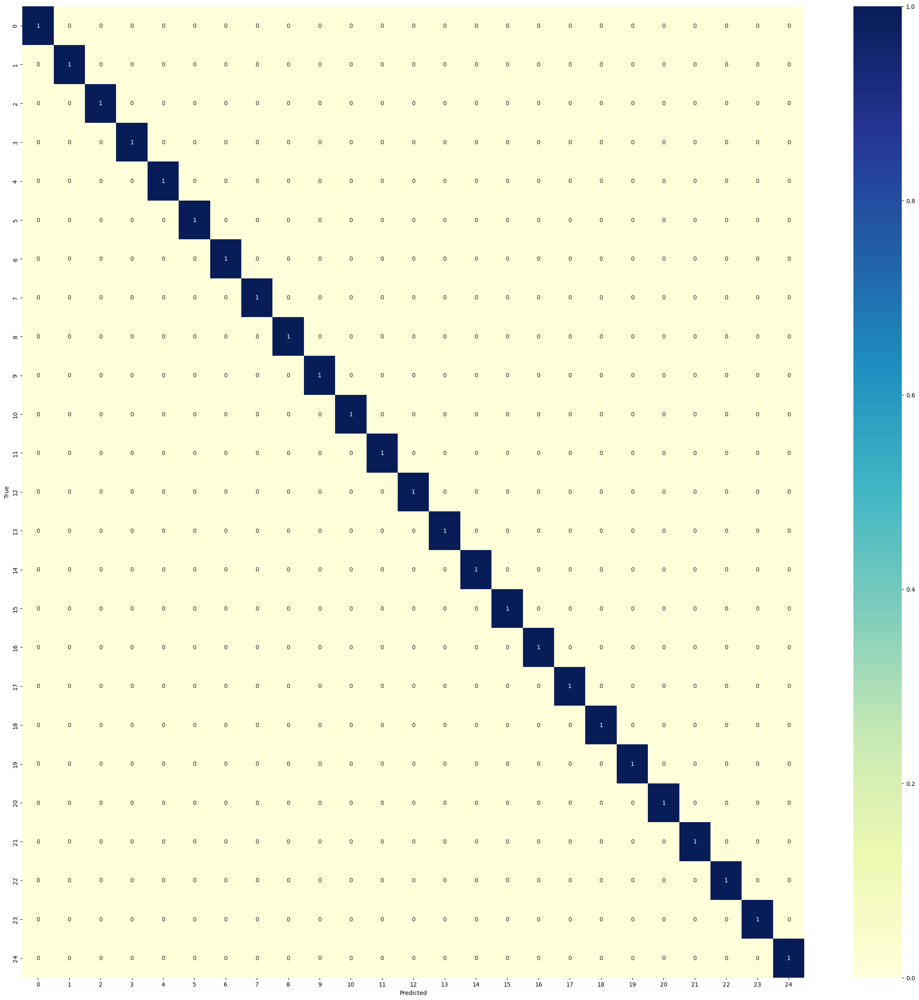

1/1 [==============================] - 0s 33ms/step - loss: 0.0115 - accuracy: 1.0000
Accuracy on validation data: 1.0
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 cast_to_float32 (CastToFloa  (None, 64, 64, 3)        0         
 t32)                                                            
                                                                 
 normalization (Normalizatio  (None, 64, 64, 3)        7         
 n)                                                              
                                                                 
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 32)       0         
 )      

In [ ]:
# Создание экземпляра модели
best_model = clf.export_model()

# Загрузка весов модели
best_model.load_weights('/content/drive/MyDrive/Dekart/model_New2')

# Выполнение предсказаний на тестовой выборке
y_pred = best_model.predict(x_test_n)

# Вычисление точности (accuracy) на тестовой выборке
accuracy = best_model.evaluate(x_test_n, y_test_n)[1]
print("Accuracy on test data: {:.2%}".format(accuracy))

# Вычисление матрицы ошибок
y_test_nclasses = [tf.argmax(y_test_n[i]).numpy() for i in range(len(y_test_n))]
y_pred_classes = [tf.argmax(y_pred[i]).numpy() for i in range(len(y_pred))]
confusion_mtx = confusion_matrix(y_test_nclasses, y_pred_classes)

# Отображение матрицы ошибок в графическом виде
plt.figure(figsize=(30,30))
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Оценка точности модели на проверочной выборке

accuracy = best_model.evaluate(x_test_n, y_test_n)[1]
accuracy_np = np.array(accuracy)
print("Accuracy on validation data:", accuracy_np)
# Вывод структуры модели
best_model.summary()

# Результат


In [24]:
!mkdir /content/drive/MyDrive/Dekart/Dekart_new/
!ls /content/drive/MyDrive/Dekart64_2/
!cp -r /content/drive/MyDrive/Dekart/Iris1920x1080_2/* /content/drive/MyDrive/Dekart/Dekart_new/
!cp -r /content/drive/MyDrive/Dekart/Dekart64_2/* /content/drive/MyDrive/Dekart/Dekart_new/
IMAGE_PATH2 = '/content/drive/MyDrive/Dekart/Dekart_new/'
!ls /content/drive/MyDrive/Dekart/Dekart_new/
!mkdir /content/drive/MyDrive/Dekart/test_new/
!ls /content/drive/MyDrive/Dekart/
!cp -r /content/drive/MyDrive/Dekart/test1920x1080-Izm/* /content/drive/MyDrive/Dekart/test_new/
!cp -r /content/drive/MyDrive/Dekart/test-Izm/* /content/drive/MyDrive/Dekart/test_new/
IMAGE_PATH3 = '/content/drive/MyDrive/Dekart/test_new/'
!ls /content/drive/MyDrive/Dekart/test_new/
'''1. Создает директорию Dekart_new в папке Dekart на Google Drive:'''
!mkdir /content/drive/MyDrive/Dekart/Dekart_new/

'''2. Осуществляет вывод списка содержимого в папке Dekart:'''
!ls /content/drive/MyDrive/Dekart/
'''3. Копирует все файлы в директорий Dekart1920x1080-Izm и Dekart-Izm1 в
созданную ранее папку Dekart_new:'''
!cp -r /content/drive/MyDrive/Dekart/Iris1920x1080_2/* /content/drive/MyDrive/Dekart/Dekart_new/
!cp -r /content/drive/MyDrive/Dekart/Dekart64_2/* /content/drive/MyDrive/Dekart/Dekart_new/

'''4. Задается переменная IMAGE_PATH2 для дальнейшего использования:'''
IMAGE_PATH2 = '/content/drive/MyDrive/Dekart/Dekart_new/'

'''5. Осуществляет вывод списка содержимого в созданной директории Dekart_new:'''
!ls /content/drive/MyDrive/Dekart/Dekart_new/
'''6. Создает директорию test_new в папке Dekart на Google Drive:'''
!mkdir /content/drive/MyDrive/Dekart/test_new/
'''7. Осуществляет вывод списка содержимого в папке Dekart:'''
!ls /content/drive/MyDrive/Dekart/
'''8. Копирует все файлы в директории test1920x1080-Izm и test-Izm в созданную
ранее папку test_new:'''
!cp -r /content/drive/MyDrive/Dekart/test1920x1080-Izm/* /content/drive/MyDrive/Dekart/test_new/
!cp -r /content/drive/MyDrive/Dekart/test-Izm/* /content/drive/MyDrive/Dekart/test_new/
'''9. Задается переменная IMAGE_PATH3 для дальнейшего использования:'''
IMAGE_PATH3 = '/content/drive/MyDrive/Dekart/test_new/'
'''10. Осуществляет вывод списка содержимого в созданной директории test_new:'''
!ls /content/drive/MyDrive/Dekart/test_new/

mkdir: cannot create directory ‘/content/drive/MyDrive/Dekart/Dekart_new/’: File exists
ls: cannot access '/content/drive/MyDrive/Dekart64_2/': No such file or directory
001  007  013  019  025  031  037  043	049  055  061  067  073  079  085
002  008  014  020  026  032  038  044	050  056  062  068  074  080  086
003  009  015  021  027  033  039  045	051  057  063  069  075  081  087
004  010  016  022  028  034  040  046	052  058  064  070  076  082  088
005  011  017  023  029  035  041  047	053  059  065  071  077  083  089
006  012  018  024  030  036  042  048	054  060  066  072  078  084
mkdir: cannot create directory ‘/content/drive/MyDrive/Dekart/test_new/’: File exists
12		     model_04.07.1_final  model_result	     x_val64_g.npy
Dekart64	     model_04.07.2_final  test		     x_val_g.npy
Dekart64_1	     model_13.06.1_final  test1920x1080      x_val_n.npy
Dekart64_2	     model_16.06.1_final  test1920x1080-Izm  y_test64_g.npy
Dekart_new	     model_24.05	  test-Izm	     y_test_g

In [25]:
# Определение списка имен классов
CLASS_LIST2 = sorted(os.listdir(IMAGE_PATH2))
# Определение количества классов
CLASS_COUNT2 = len(CLASS_LIST2)
# Проверка результата
print(f'Количество классов: {CLASS_COUNT2}, метки классов: {CLASS_LIST2}')

# Создаем пустые списки для хранения путей к файлам изображений и меток классов
image_paths_n1 = []
labels_n1 = []

# Получаем список папок, содержащихся в директории '/content/drive/MyDrive/Dekart/Dekart_new/'
dir_path1 = "/content/drive/MyDrive/Dekart/Dekart_new/"
categories1 = os.listdir(dir_path1)

# Проходим по каждой папке и добавляем в списки путь к файлу изображения и метку класса
for category in categories1:
    category_path1 = os.path.join(dir_path1, category)
    if os.path.isdir(category_path1):
        files = os.listdir(category_path1)
        print(f"Number of images in '{category}': {len(files)}")
        for file_name1 in files:
            file_path1 = os.path.join(category_path1, file_name1)
            image_paths_n1.append(file_path1)
            labels_n1.append(category)

# Выводим результаты
print("Total number of images:", len(image_paths_n1))
print("Total number of labels:", len(labels_n1))

Количество классов: 89, метки классов: ['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '067', '068', '069', '070', '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '085', '086', '087', '088', '089']
Number of images in '065': 45
Number of images in '066': 45
Number of images in '067': 45
Number of images in '068': 45
Number of images in '069': 45
Number of images in '070': 45
Number of images in '071': 45
Number of images in '072': 45
Number of images in '073': 45
Number of images in '074': 45
Number of images in '075': 45
Number 

In [22]:
# Создаем пустые списки для хранения путей к файлам изображений и меток классов
test_image_paths = []
test_labels = []

# Получаем список папок, содержащихся в директории '/content/drive/MyDrive/Dekart/test-Izm1'
test_dir_path = '/content/drive/MyDrive/Dekart/test_new/'
test_categories = os.listdir(test_dir_path)

# Проходим по каждой папке и добавляем в списки путь к файлу изображения и метку класса
for category in test_categories:
    category_path = os.path.join(test_dir_path, category)
    if os.path.isdir(category_path):
        files = os.listdir(category_path)
        print(f"Number of images in '{category}': {len(files)}")
        for file_name in files:
            file_path = os.path.join(category_path, file_name)
            test_image_paths.append(file_path)
            test_labels.append(category)

# Выводим результаты
print("Total number of test images:", len(test_image_paths))
print("Total number of test labels:", len(test_labels))

Number of images in '065': 1
Number of images in '066': 1
Number of images in '067': 1
Number of images in '068': 1
Number of images in '069': 1
Number of images in '070': 1
Number of images in '071': 1
Number of images in '072': 1
Number of images in '073': 1
Number of images in '074': 1
Number of images in '075': 1
Number of images in '076': 1
Number of images in '077': 1
Number of images in '078': 1
Number of images in '079': 1
Number of images in '080': 1
Number of images in '081': 1
Number of images in '082': 1
Number of images in '083': 1
Number of images in '084': 1
Number of images in '085': 1
Number of images in '086': 1
Number of images in '087': 1
Number of images in '088': 1
Number of images in '089': 1
Number of images in '001': 1
Number of images in '002': 1
Number of images in '003': 1
Number of images in '004': 1
Number of images in '005': 1
Number of images in '006': 1
Number of images in '007': 1
Number of images in '008': 1
Number of images in '009': 1
Number of imag

# Продолжение

Теперь вы можете увидеть, что находится в загруженной базе. Для этого функцией `listdir()` из модуля **os** получите список папок по адресу **IMAGE_PATH**:

In [26]:

# Создаем экземпляр LabelEncoder и преобразуем лейблы в числовой формат
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(labels_n1)

# Создаем экземпляр OneHotEncoder и преобразуем числовые значения в One-Hot Encoding
onehot_encoder = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoded = onehot_encoder.fit_transform(integer_encoded)

# Выводим результат
print(onehot_encoded)

# Создаем экземпляр LabelEncoder и преобразуем лейблы в числовой формат
test_label_encoder = LabelEncoder()
test_integer_encoded = test_label_encoder.fit_transform(test_labels)

# Создаем экземпляр OneHotEncoder и преобразуем числовые значения в One-Hot Encoding
test_onehot_encoder = OneHotEncoder(sparse=False)
test_integer_encoded = test_integer_encoded.reshape(len(test_integer_encoded), 1)
test_onehot_encoded = test_onehot_encoder.fit_transform(test_integer_encoded)

# Выводим результат
print(test_onehot_encoded)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [34]:
images_n1 = []

# Проходим по каждому пути к файлу изображения и добавляем его в список
for path in image_paths_n1:
    with Image.open(path) as img:
        img = img.resize((64, 64)) # изменяем размер изображения до 900x512 пикселей
        img = np.array(img) # приводим изображение к формату numpy массива
        images_n1.append(img) # добавляем изображение в список

# Преобразуем список в формат numpy массива
images_n1 = np.array(images_n1)

# Преобразуем список меток классов в формат numpy массива

labels_onehot_n1 = np.array(onehot_encoded)

# Выводим размерности массивов с изображениями и метками классов
print("Shape of images array:", images_n1.shape)
print("Shape of labels array:", labels_onehot_n1.shape)



Shape of images array: (5285, 64, 64, 3)
Shape of labels array: (5285, 89)


In [33]:
# Создаем пустой список для изображений
test_images_n1 = []

# Проходим по каждому пути к файлу изображения и добавляем его в список
for path in test_image_paths:
    with Image.open(path) as img:
        img = img.resize((64, 64)) # изменяем размер изображения до 128x128 пикселей
        img = np.array(img) # приводим изображение к формату numpy массива
        test_images_n1.append(img) # добавляем изображение в список

# Преобразуем список в формат numpy массива
test_images_n1 = np.array(test_images_n1)

# Преобразуем список меток классов в формат numpy массива
test_labels_onehot_n = np.array(test_onehot_encoded)

# Выводим размерности массивов с изображениями и метками классов
print("Shape of test images array:", test_images_n1.shape)
print("Shape of test labels array:", test_labels_onehot_n.shape)

Shape of test images array: (89, 64, 64, 3)
Shape of test labels array: (89, 89)


In [35]:
# Разделяем данные на тренировочную и тестовую выборки
x_train_n, x_val_n, y_train_n, y_val_n = train_test_split(images_n1, labels_onehot_n1, test_size=0.2, stratify=labels_onehot_n1)
x_test_n, y_test_n =  test_images_n1, test_labels_onehot_n
# Выводим размеры тренировочной и тестовой выборок
print("x_train_n shape:", x_train_n.shape)
print("y_train_n shape:", y_train_n.shape)
print("X_val_n shape:", x_val_n.shape)
print("y_val_n shape:", y_val_n.shape)
print("x_test_n shape:", x_test_n.shape)
print("y_test_n shape:", y_test_n.shape)

# Разделяем данные на тренировочную и тестовую выборки
#X_Train64_n, X_val64_n, y_Train64_n, y_val64_n = train_test_split(images64, labels_onehot64_n, test_size=0.2, random_state=42)
#X_train64_n, X_test64_n, y_train64_n, y_test64_n = train_test_split(X_Train64, y_Train64, test_size=0.2, random_state=42)
# Выводим размеры тренировочной и тестовой выборок
#print("X_train_n shape:", X_train64_n.shape)
#print("y_train_n shape:", y_train64_n.shape)
#print("X_val_n shape:", X_val64_n.shape)
#print("y_val_n shape:", y_val64_n.shape)
#print("X_test_n shape:", X_test64_n.shape)
#print("y_test_n shape:", y_test64_n.shape)

x_train_n shape: (4228, 64, 64, 3)
y_train_n shape: (4228, 89)
X_val_n shape: (1057, 64, 64, 3)
y_val_n shape: (1057, 89)
x_test_n shape: (89, 64, 64, 3)
y_test_n shape: (89, 89)


In [29]:
from sklearn.preprocessing import OneHotEncoder
# преобразование мультиклассовых меток в мультиэтикеточные
encoder = OneHotEncoder()
y_test_n_encoded = encoder.fit_transform(y_test_n)
# определенин inputs и outputs:

input_node = ak.ImageInput()
output_node = ak.Normalization()(input_node)
output_node = ak.ConvBlock()(output_node)
output_node = ak.DenseBlock()(output_node)
output_node = ak.ClassificationHead()(output_node)
clf = ak.AutoModel(inputs=input_node, outputs=output_node, overwrite=True,
                   max_trials=10, objective='val_accuracy')
'''
В данном примере мы создаем input_node с помощью метода ImageInput(),
а затем поочередно применяем блоки для нормализации, сверточных слоев,
плотных слоев и блок для классификации, чтобы определить выходной узел
output_node.
'''

clf = ak.AutoModel(
    inputs=input_node,
    outputs=output_node,
    overwrite=True,
    max_trials=3,
    objective="val_accuracy"
)

clf.fit(
    x_train_n,
    y_train_n,
    validation_data=(x_val_n, y_val_n),
    epochs=50,
    callbacks=[tf.keras.callbacks.EarlyStopping(
        patience=5,
        restore_best_weights=True
    )]
)

# Сохранение модели в формате Tensorflow SavedModel
clf.export_model().save('/content/drive/MyDrive/Dekart/model_New')

Trial 3 Complete [00h 00m 18s]
val_accuracy: 0.9905392527580261

Best val_accuracy So Far: 0.9914853572845459
Total elapsed time: 00h 01m 04s


3/3 [==============================] - 0s 6ms/step - loss: 1.3272 - accuracy: 0.8315
Accuracy on test data: 83.15%


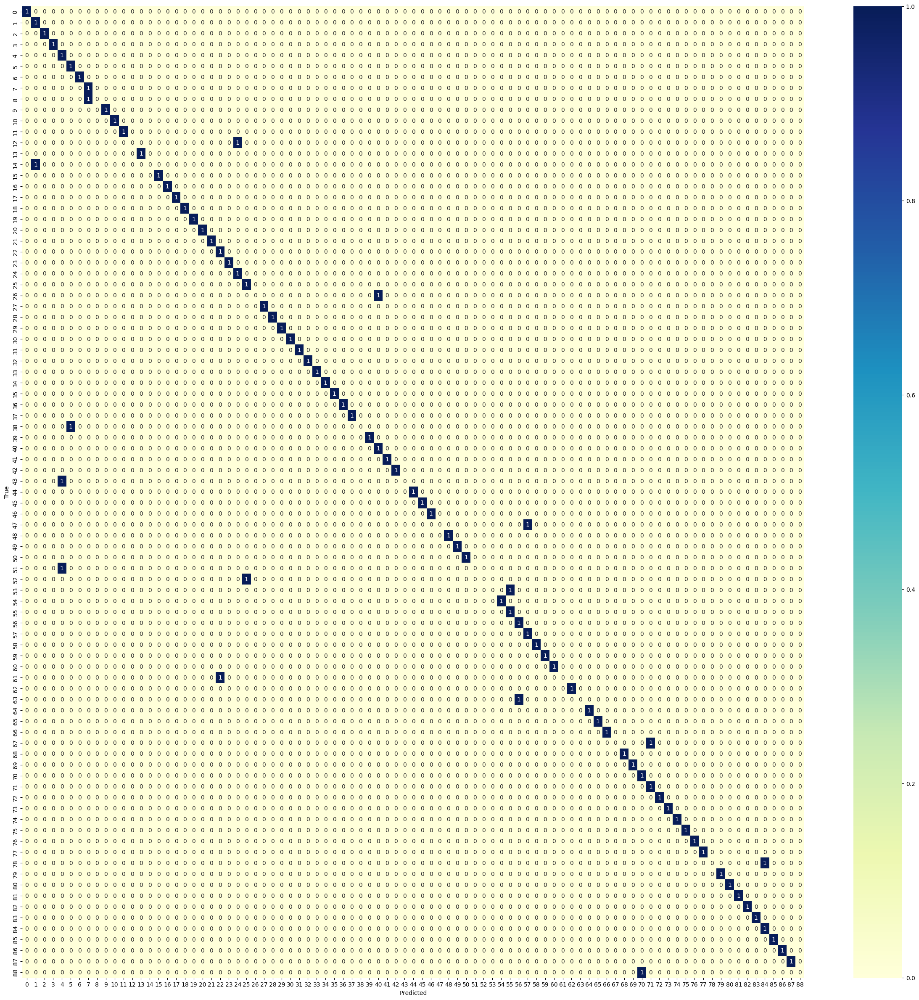

3/3 [==============================] - 0s 5ms/step - loss: 1.3272 - accuracy: 0.8315
Accuracy on validation data: 0.8314606547355652
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 cast_to_float32 (CastToFloa  (None, 64, 64, 3)        0         
 t32)                                                            
                                                                 
 normalization (Normalizatio  (None, 64, 64, 3)        7         
 n)                                                              
                                                                 
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 60, 32)        9248 

In [36]:
# Создание экземпляра модели
best_model = clf.export_model()

# Загрузка весов модели
best_model.load_weights('/content/drive/MyDrive/Dekart/model_New')

# Выполнение предсказаний на тестовой выборке
y_pred = best_model.predict(x_test_n)

# Вычисление точности (accuracy) на тестовой выборке
accuracy = best_model.evaluate(x_test_n, y_test_n)[1]
print("Accuracy on test data: {:.2%}".format(accuracy))

# Вычисление матрицы ошибок
y_test_nclasses = [tf.argmax(y_test_n[i]).numpy() for i in range(len(y_test_n))]
y_pred_classes = [tf.argmax(y_pred[i]).numpy() for i in range(len(y_pred))]
confusion_mtx = confusion_matrix(y_test_nclasses, y_pred_classes)

# Отображение матрицы ошибок в графическом виде
plt.figure(figsize=(30,30))
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Оценка точности модели на проверочной выборке

accuracy = best_model.evaluate(x_test_n, y_test_n)[1]
accuracy_np = np.array(accuracy)
print("Accuracy on validation data:", accuracy_np)
# Вывод структуры модели
best_model.summary()